"42. Answer to the Ultimate Question of Life, the Universe, and Everything"

---*The Hitchhiker's Guide to the Galaxy*

Trust the notebook, unless there will be some part of the output imcomplete.

In [1]:
# import the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msn
import seaborn as sns
import warnings
import scipy as sp
from dataprep.eda import plot
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from xgboost import XGBRegressor, XGBClassifier
from sklearn.metrics import mean_squared_log_error, make_scorer, roc_auc_score
import lightgbm as lgb
import re
from sklearn.model_selection import cross_val_score, KFold, GridSearchCV
import optuna
from optuna.samplers import TPESampler
from sklearn.ensemble import RandomForestRegressor
import random
from mlxtend.regressor import StackingCVRegressor

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

# if you want to re-run the whole notebook in one go, use:
%matplotlib inline
# if your notebook color theme is dark, 
# or you want to run the code block by block, use the line below:
#%matplotlib notebook


In [2]:
# for reproducibility
np.random.seed(42)
random.seed(42)

# 1. Read the data

In [3]:
# read in the data
traindf = pd.read_csv("train.csv")
df = traindf.copy()


# data shape, data type, and non-null counts
print('the number of columns: ', len(df.columns))
print('the number of observations: ', len(df))
print('*'*60)
df.info()

the number of columns:  60
the number of observations:  20408
************************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20408 entries, 0 to 20407
Data columns (total 60 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   name                                          20408 non-null  object 
 1   description                                   19751 non-null  object 
 2   neighborhood_overview                         12536 non-null  object 
 3   host_name                                     20408 non-null  object 
 4   host_since                                    20408 non-null  object 
 5   host_location                                 20384 non-null  object 
 6   host_about                                    10864 non-null  object 
 7   host_response_time                            8385 non-null   object 
 8   host_response

In [4]:
# random 5 observations:
df.sample(5)

,name,description,neighborhood_overview,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,price
14940,Close to Airport and CBD with Secure Parking,"My home is spacious, which is 1 or 2 stops on...","Though I am close to the airport, there is a c...",Beverley And Michael,2011-12-31,"Mascot, New South Wales, Australia",I have travelled extensively since I was 3 yea...,within an hour,100%,100%,t,Mascot,2.0,2.0,"['email', 'phone', 'facebook', 'reviews', 'jum...",t,"Mascot, New South Wales, Australia",Botany Bay,NaN,-33.92079,151.19064,Private room in apartment,Private room,3,1 private bath,1.0,2.0,"[""Patio or balcony"", ""Bed linens"", ""Coffee mak...",1,1125,1,1,1125,1125,1.0,1125.0,t,21,50,80,355,671,25,1,2015-11-23,2021-02-03,97.0,10.0,10.0,10.0,10.0,10.0,10.0,t,1,0,1,0,10.56,$64.00
6695,Sunny top floor large one bedroom apartment,"Bright Boho apartment, spacious and airy .<br ...",The neighbourhood is located in easy walking d...,Emma,2015-01-21,"New South Wales, Australia",NaN,NaN,NaN,NaN,f,NaN,1.0,1.0,"['phone', 'reviews', 'jumio', 'offline_governm...",t,"Kingsford, New South Wales, Australia",Randwick,NaN,-33.92254,151.22970,Entire apartment,Entire home/apt,2,1 bath,1.0,2.0,"[""Washer"", ""Iron"", ""Free parking on premises"",...",12,14,12,12,14,14,12.0,14.0,t,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN,$120.00
7457,"Charming, spacious 2 bedroom apartment","Light, spacious, charming older-style 2 bedroo...","Unmetered, on-street parking with AM clearway ...",Don,2016-04-18,Australia,NaN,NaN,NaN,NaN,f,Bellevue Hill,1.0,1.0,"['email', 'phone']",f,"Double Bay, New South Wales, Australia",Woollahra,NaN,-33.87401,151.24805,Private room in apartment,Private room,2,1 shared bath,2.0,1.0,"[""Washer"", ""Iron"", ""Smoke alarm"", ""Dryer"", ""Ki...",3,10,3,3,10,10,3.0,10.0,t,0,0,0,0,2,0,0,2018-10-29,2018-11-11,80.0,9.0,6.0,8.0,9.0,10.0,10.0,f,1,0,1,0,0.07,$75.00
1599,"Spacious 2 bedroom, 2 bathroom apartment, Rose...",Spacious 2 bedrooms including queen size bed a...,NaN,Tanya,2015-06-30,"Sydney, New South Wales, Australia",NaN,NaN,NaN,NaN,f,Rosebery,1.0,1.0,"['email', 'phone', 'google', 'reviews', 'jumio...",t,NaN,Sydney,NaN,-33.91560,151.20935,Entire apartment,Entire home/apt,4,2 baths,2.0,2.0,"[""Bathtub"", ""Gym"", ""Children\u2019s books and ...",4,1125,4,4,1125,1125,4.0,1125.0,t,0,0,0,0,1,0,0,2019-01-01,2019-01-01,60.0,10.0,4.0,10.0,6.0,10.0,10.0,t,1,1,0,0,0.04,$140.00
18737,Large sun-lit bedroom in Woollahra,A large sun-lit bedroom with a queen sized bed...,NaN,Lucinda,2015-11-18,"New South Wales, Australia",NaN,NaN,NaN,NaN,f,Woollahra,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,NaN,Woollahra,NaN,-33.88839,151.25319,Private room in house,Private room,1,1 bath,1.0,1.0,"[""Washer"", ""Iron"", ""Free parking on premises"",...",1,1125,1,1,1125,1125,1.0,1125.0,t,0,0,0,0,1,0,0,2015-12-01,2015-12-01,80.0,8.0,6.0,10.0,10.0,10.0,6.0,f,1,0,1,0,0.02,$55.00


In [5]:
# drop the completely useless column
df = df.drop('neighbourhood_group_cleansed', axis = 1)

# 2. Data Understanding
*The data cleaning procedures are mixed with exploratory data analysis to ensure the logic is coherent.*

## 2.1 Missing Value overview:

In [6]:
# drop the columns without missing values for plotting
missingvalue_query = df.isnull().sum() != 0
missingvalue_df = df[df.columns[missingvalue_query]]

<AxesSubplot:>

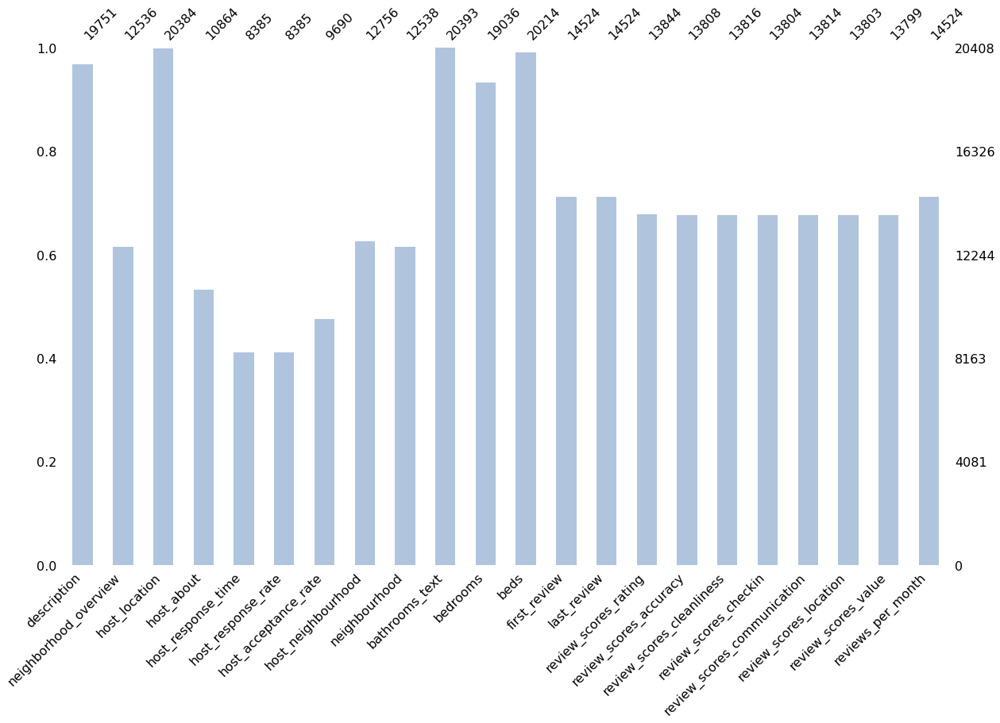

In [7]:
# bar chart for missing values
msn.bar(missingvalue_df,figsize = (20,12), color='lightsteelblue')

<AxesSubplot:>

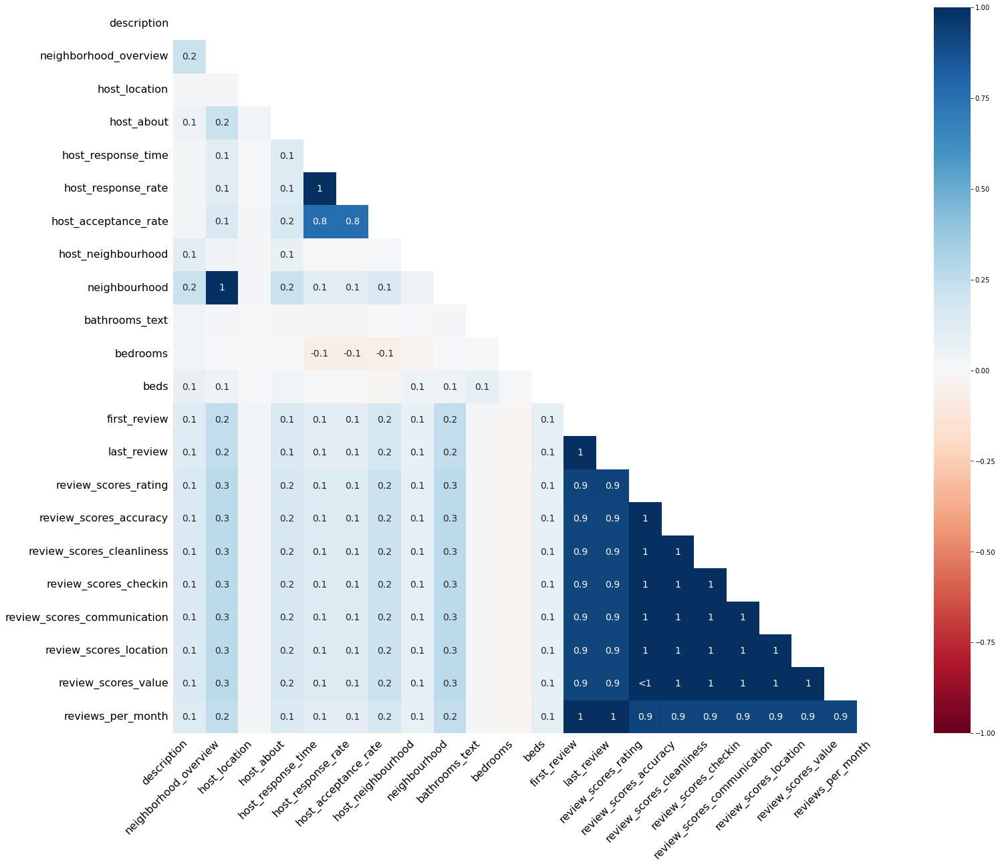

In [8]:
# missing value heatmap
msn.heatmap(missingvalue_df,figsize = (24,20))

Based on 2 plots above: ( there might be some display problems )
1. `description`, `host_location`, `bathrooms_text`, `bedrooms`, `beds` are features with small portion of missing values. `response_time` and `response_rate` are feature with over a half missing values.
2. In the heatmap, high correlation means missing value are occured in the same observation. which are: 1) columns about reviews. 2)`neighbourbood` and `neighborhood_overview`. 3)`host_response_rate`, `host_response_time`,`host_acceptance_rate`

# 2.2. Data Segments


With 60 features in total, categorizing the features into different groups is necessary and more logical.

By interpreting the column names and first 2 observations, the dataset can be categorized by its meaning into several segments.


1. Basic infomation columns: 

These two features are entered by the host, which is the very first information the user would be exposed to, and they are relatively subjective as the host want to attract customers.

Including: 

In [9]:
BasiInfoQuery = ['name' , 'description']

2. Host-related columns: 

these are columns describing the information and behaviours of the host.

Including: 


In [10]:
HostRelaQuery = ['host_name','host_since','host_location','host_about','host_response_time',
                  'host_response_rate','host_acceptance_rate','host_is_superhost',
                  'host_listings_count','host_total_listings_count',
                  'host_verifications','host_identity_verified']

3. location related columns:

these are columns describing the neighborhood and location of the accommodation.

Including:


In [11]:
LocaRelaQuery = ['neighborhood_overview','neighbourhood','neighbourhood_cleansed',
                 'host_neighbourhood','neighbourhood_group_cleansed',
                 'latitude','longitude']

4. accommodation related columns:

these are columns describing the accommodation's type and facilities.

Including:



In [12]:
AccoRelaQuery = ['property_type','room_type','accommodates','bathrooms_text',
                 'bedrooms','beds','amenities']

5. availability columns:

these are columns describing whether the listing's availability, and the length of time customers can stay.

Including:


In [13]:
AvaiQuery = ['minimum_nights','maximum_nights','minimum_minimum_nights',
             'maximum_minimum_nights','minimum_maximum_nights','maximum_maximum_nights',
             'minimum_nights_avg_ntm','maximum_nights_avg_ntm','has_availability',
             'availability_30','availability_60','availability_90','availability_365',
             'instant_bookable']

6. review related columns:

these are columns describing the reviews given by the customers.

Including:

In [14]:
ReviRelaQuery = ['number_of_reviews','number_of_reviews_ltm','number_of_reviews_l30d',
                 'first_review','last_review','review_scores_rating','review_scores_accuracy',
                 'review_scores_cleanliness','review_scores_checkin','review_scores_communication',
                 'review_scores_location','review_scores_value','reviews_per_month']

7. Listing related columns:

hosts can create listing for recording accommodations that follow certain themes.

Including:

In [15]:
ListRelaQuery = ['calculated_host_listings_count',
                 'calculated_host_listings_count_entire_homes',
                 'calculated_host_listings_count_private_rooms',
                 'calculated_host_listings_count_shared_rooms']

8. Target variable - `price`

This is the price per night in AUD$

## 2.3. Target

In [16]:
# converting the price column's data type to float
df.price = df.price.replace("[\$',]",'',regex= True).astype(float)

  0%|                                                                                          | 0/107 [00:00<…


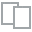
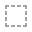
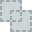
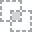
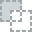
...
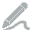
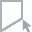
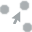
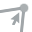
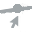

In [17]:
plot(df,'price')

It is obviously right-skewed, a log transform is implemented.

In [18]:
df['log_price'] = np.log(df.price)

  0%|                                                                                          | 0/107 [00:00<…


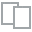
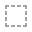
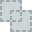
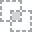
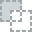
...
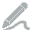
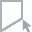
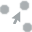
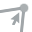
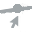

In [19]:
plot(df,'log_price')

It is still right-skewed after logarithm. Another logarithm can be implemented but decreasing the interpretability.

## 2.4. Basic information columns

These information are entered by the host, which is highly subjective as no host will post any bad words on these information. 

It is observed that some information about the listing is inside the name and description, such as location, facilities, convenience, etc., which might help in predicting the price. However, these information is also largely included in other columns. 

Therefore, deleting these two columns is of little impact to predicting the prices.

In [20]:
df[BasiInfoQuery].sample(5)

,name,description
11175,Meet Pepe! Comfortable and privat camper van,You’re tired of sharing your room with snoring...
283,2 bedrm 2 bathrm apartment in convenient location,"simple, modern, clean overall style, high ceil..."
20333,Simple Neat Cosy Unit in Crows nest,Cosy Unit in Crows nest<br />Enjoy living in o...
8869,Spacious and bright apartment close to CBD,Welcome to our lovely and cosy apartment!<br /...
8895,Leo's economy accommodation,central air condition in the whole house area....


In [21]:
# whether to have a description of the accommodation 
# can relfect how much the host put effort on advertising it.
df['description_isna'] = df.description.isna().astype(int)

In [22]:
# a t-test for whether there are actually difference in price
a = df['price'][df['description_isna'] == True] 
b = df['price'][df['description_isna'] == False] 
sp.stats.ttest_ind(a,b,alternative = 'less')

Ttest_indResult(statistic=-1.7525150053443874, pvalue=0.039850154641626216)

From the statistically significant(95% confidence) t-test, it is concluded that listing without description has lower price than the ones with description.

In [23]:
# this line is left blank deliberately
# a nlp algorithm can be implemented to transform the name and description 
# in order to capture the possible useful information
pass

In [24]:
df = df.drop(BasiInfoQuery, axis =1)

## 2.5. Host-related features

In [25]:
#delete
df[HostRelaQuery].sample(5)

,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_verifications,host_identity_verified
13318,Shadia,2014-10-12,AU,NaN,within a few hours,100%,100%,f,3.0,3.0,"['email', 'phone', 'reviews']",f
18512,Natalie,2019-11-30,AU,NaN,NaN,NaN,NaN,f,0.0,0.0,['phone'],f
19213,June,2011-08-01,"Sydney, New South Wales, Australia","I am in my mid 50s. I enjoy travel, finding ne...",NaN,NaN,NaN,f,1.0,1.0,"['email', 'phone', 'facebook', 'reviews', 'jum...",t
6808,Mary Jane,2013-05-12,"Sydney, New South Wales, Australia","I enjoy cooking, meeting new people and playin...",NaN,NaN,67%,f,1.0,1.0,"['email', 'phone', 'facebook', 'reviews', 'jum...",t
3063,Miriam,2017-04-12,"Sydney, New South Wales, Australia","Self employed hairdresser, lives in Sydney Aus...",within a few hours,100%,0%,f,1.0,1.0,"['email', 'phone', 'facebook', 'reviews', 'jum...",t


### host_name

In [26]:
# check if every host has unique host_name
df[df.host_name == 'David'].host_listings_count.unique()

array([ 6.,  3.,  1.,  2., 23.,  0., 11.,  4., 27.,  5.,  7.])

It is observed that different hosts can have same `host_name` column, making the `host_name` useless.

In [27]:
# drop host_name column
df = df.drop('host_name', axis =1)

### host_since

This column is `object` datatype, and should be converted into how many days to the day it is collected(however this is also not available, just for approximation, the day for substraction is the day of kaggle competition is launched, which is Sep 23rd 2021).

In [28]:
# first, convert object to datetime
df['host_since'] = pd.to_datetime(df['host_since'])

# second, datetime substraction
df['host_since'] = df['host_since'].apply(lambda x:(pd.to_datetime('2021-09-23')-x).days)

  0%|                                                                                          | 0/107 [00:00<…


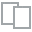
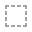
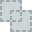
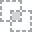
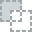
...
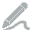
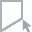
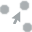
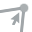
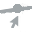

In [29]:
plot(df,'host_since')

There is no negative values, and it is approximately normal distributed.

### host_location

This column is where the host lives instead of where the accommodation is, which is relatively useless.
However, if the host_location is the same as the location of the accommodation, the host may provide more satisfying services. Here we just simply drop the column.

In [30]:
# this line is left blank deliberately
# host_location == neighbourhood_cleansed could be tested
pass

In [31]:
df = df.drop('host_location', axis =1)

### host_about
This column is for hosts introducing themselves, due to its large portion of missing values and textual subjective content, it is also considered to be useless. 

However, this column might give information of whether the host are putting efforts on operating the account and advertsing themselves.

In [32]:
# this line is left blank deliberately
# nlp can be used to extract some keyword in the column
pass

In [33]:
df['host_about_isna'] = df.host_about.isna().astype(int)
df = df.drop('host_about', axis = 1)

### host_response_rate , host_response_time , host_acceptance_rate

It is mentioned in the missing value overview that these three columns has strong correlation in terms of missing values. 

These 3 columns are indicators of whether the host and the listing are active. (https://www.airbnb.com/resources/hosting-homes/a/understanding-response-rate-and-acceptance-rate-86)

In [34]:
df['host_response_time'].value_counts()

within an hour        4727
within a day          1470
within a few hours    1452
a few days or more     736
Name: host_response_time, dtype: int64

In [35]:
# host_response_rate and host_acceptance_rate are continuous variable, convert them.

df['host_response_rate']=df['host_response_rate'][df['host_response_rate'].isna()==False].apply(lambda x:int(x[:-1]))
df['host_acceptance_rate']=df['host_acceptance_rate'][df['host_acceptance_rate'].isna()==False].apply(lambda x:int(x[:-1]))


<AxesSubplot:xlabel='host_response_rate', ylabel='Count'>

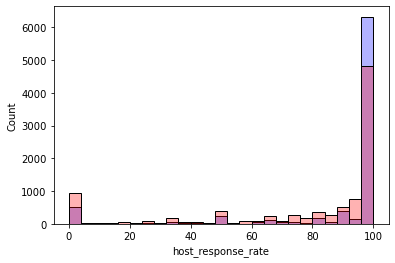

In [36]:
sns.histplot(data = df, x = 'host_response_rate', alpha = 0.3, color = 'blue', bins = 25 )
sns.histplot(data = df, x = 'host_acceptance_rate', alpha = 0.3, color = 'red', bins = 25 )

Host with high response_rate will also have high acceptance_rate, indicating a highly active host.

In [37]:
# a binary variable to indicate the missing value
df['host_response_rate_isna'] = df['host_response_rate'].isna().astype(int)
df['host_acceptance_rate_isna'] =  df['host_acceptance_rate'].isna().astype(int)

# fill the missing value with 0
df['host_response_rate'][df['host_response_rate'].isna()] = 0
df['host_acceptance_rate'][df['host_acceptance_rate'].isna()] = 0

# host_response_time is categorical data:
df['host_response_time'][df['host_response_time'].isna()] = 'no response'

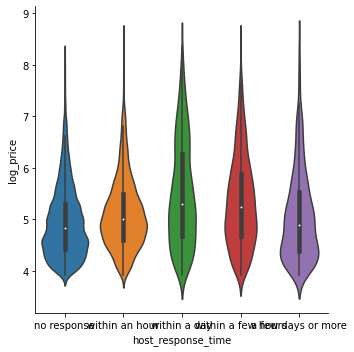

In [38]:
sns.catplot(x="host_response_time", y="log_price", 
               data=df, kind="violin")

From the plot above, the distribution of price are different between different response time. However, such difference are relatively minor.





`host_response_time` is a low-cardinality categorical variable, which means it can be encoded.

>this is just for reference in later feature engineering:

```py
from sklearn.preprocessing import OrdinalEncoder
OrdEnc = OrdinalEncoder()
df['host_response_time'] = OrdEnc.fit_transform(df['host_response_time'])
# valid data should be `.transform()`
```

Or, one-hot encoded:
```py
from sklearn.preprocessing import OneHotEncoder
OHEnc = OneHotEncoder()
df['host_response_time'] = OHEnc.fit_transform(df['host_response_time'])
# valid data and test data should be `.transform()`
```

### host_is_superhost
According to information provided by Airbnb (https://www.airbnb.com/d/superhost), a superhost can be considered as a important factor of measuring the quality of service provided by the host, which will influence the price of the listing, more statistical evidence is provided below.

In [39]:
# first, convert the t/f column into 0/1 binary variable.
df.host_is_superhost = df.host_is_superhost.map({'t': 1, 'f': 0})

<AxesSubplot:xlabel='price', ylabel='Count'>

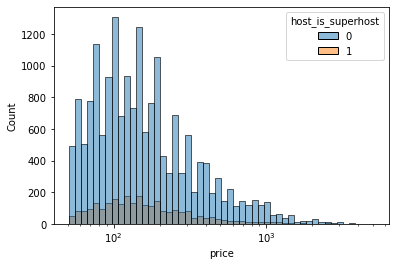

In [40]:
# second, plot the price categorized by this column.
sns.histplot(data = df, x ='price', hue ='host_is_superhost', log_scale=True, bins = 50)

In [41]:
a = df['price'][df['host_is_superhost'] == 1]
b = df['price'][df['host_is_superhost'] == 0]
sp.stats.ttest_ind(a,b,alternative = 'greater')

Ttest_indResult(statistic=-0.19814543743616678, pvalue=0.5785333753025225)

However, statistical testing does not support that host_is_superhost has strong correlation with price.

### host_listings_count , host_total_listings_count
These are columns about the accommodations included in the host, which provide little information related to the price.

In [42]:
(df.host_listings_count == df.host_total_listings_count).unique()

array([ True])

The values are totally identical.

In [43]:
df = df.drop('host_total_listings_count', axis = 1)

In [44]:
df.host_listings_count.value_counts().sort_index()

0.0        2073
1.0       10984
2.0        2718
3.0         974
4.0         515
          ...  
124.0        26
138.0        56
164.0         2
189.0        91
7235.0      188
Name: host_listings_count, Length: 63, dtype: int64

In [45]:
a = df['price'][df['host_listings_count'] <= 1]
b = df['price'][df['host_listings_count'] > 1]
sp.stats.ttest_ind(a,b,alternative = 'less')

Ttest_indResult(statistic=-7.6451367678834385, pvalue=1.0896805499204671e-14)

Statistically tested, the accommodation's host having more than 1 listings, relates to a higher price. It can be explained that the host who has more than 1 listings are much more wealthy than the one with only one or less, whose accommodation might be more luxury, which leads to higher price. 

However, the explanation above indicates that there might be correlation between the accommodation's condition with the `host_listings_count`, which will cause multicollinearity in linear model.(correlation is analysed later.)

**A clustering can be implemented here.**

### 'host_verifications','host_identity_verified'

These two columns are measuring whether the host's identity is verified and to what extent they are verified. Verified ones with more verification methos are considered as more reliable host.

In [46]:
# convert the list-like string to list data type
df.host_verifications = df.host_verifications.apply(lambda x: x.strip("[]").replace("'","").split(","))

In [47]:
# convert the t/f to 1/0
df.host_identity_verified = df.host_identity_verified.map({'t': 1, 'f': 0})

In [48]:
print(df.host_verifications.apply(len)[df.host_identity_verified == 0].mean())
print(df.host_verifications.apply(len)[df.host_identity_verified == 1].mean())

2.6837641357027464
6.31152950310559


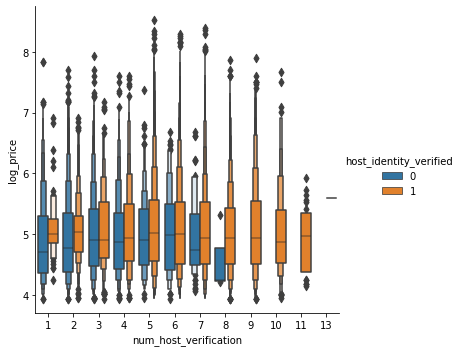

In [49]:
# counting the number of verification - how host varifies seems not a relevant indicator
df['num_host_verification'] = df.host_verifications.apply(len)
sns.catplot(x='num_host_verification', y="log_price", hue = 'host_identity_verified',
               data=df, kind="boxen")

It is observed that accommodation with identity-verified host will have slightly higher price. With number of verification increasing, there is no obvious increment in price.

## 2.6. Location related features

four text predictors relate to the location of the accommodation:
1. `neighbourhood_cleansed` is the cleansed version of `neighbourhood`
2. `neighborhood_overview` contains more precise information about the location, but it is recorded with human language which needs related models to extract useful information.
3. `host_neighbourhood` is the neighbourhood of the host, instead of the accommodation, which is relatively useless.

two continuous variables describe the exact location of the accommodation, which is the most precise location information.

In [50]:
LocaRelaQuery.remove('neighbourhood_group_cleansed')
df[LocaRelaQuery].head()

,neighborhood_overview,neighbourhood,neighbourhood_cleansed,host_neighbourhood,latitude,longitude
0,NaN,NaN,Sydney,NaN,-33.88600,151.22138
1,Whilst Camperdown and Newtown are really livel...,"Camperdown, New South Wales, Australia",Sydney,NaN,-33.89147,151.17989
2,NaN,NaN,Sydney,Surry Hills,-33.88238,151.21147
3,Multicultural Parramatta combines a buzzing co...,"Parramatta, New South Wales, Australia",Parramatta,NaN,-33.81528,151.00074
4,"Twenty minutes to the west of the Sydney CBD, ...","Ashfield, New South Wales, Australia",Ashfield,Ultimo,-33.88649,151.13558


In [51]:
# drop useless columns
df = df.drop("host_neighbourhood", axis =1)
df = df.drop("neighbourhood", axis =1)

In [52]:
df.neighbourhood_cleansed.value_counts()

Sydney              4987
Waverley            3033
Randwick            1732
Warringah           1122
Manly               1087
Woollahra            884
Pittwater            808
North Sydney         799
Marrickville         627
Leichhardt           527
Rockdale             466
Sutherland Shire     344
Botany Bay           336
Mosman               327
Ryde                 313
Parramatta           279
Willoughby           272
Canada Bay           232
Auburn               217
Hornsby              214
Ku-Ring-Gai          190
Lane Cove            177
Canterbury           161
Ashfield             138
Bankstown            129
The Hills Shire      124
Blacktown            120
Burwood              117
Penrith              105
City Of Kogarah       94
Strathfield           88
Hurstville            88
Liverpool             74
Campbelltown          52
Fairfield             44
Holroyd               38
Hunters Hill          35
Camden                28
Name: neighbourhood_cleansed, dtype: int64

The `neighbourhood_cleansed` can be treated as a categorical data, with relatively high cardinality.

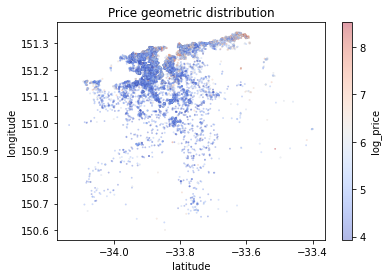

In [53]:
plt.scatter(df.latitude, df.longitude,
           linewidths=0.03, alpha=.4,
           edgecolor='k',
           s = 3,
           c=df.log_price,
           cmap = "coolwarm")
plt.xlabel("latitude")
plt.ylabel("longitude")
plt.title("Price geometric distribution")
a = plt.colorbar()
a.set_label('log_price')

In [54]:
# this line is left blank deliberately
# Some geometric analytic algorithm can be implemented 
# to extract the information from the precise location.
pass

It is observed from the plot that geometric location of the accommodation has correlation with price. 

And these two variables are more complete, authentic and precise compared with `neighborhood_overview`.

In [55]:
df = df.drop("neighborhood_overview", axis =1)

In [56]:
# this line is left blank deliberately
# nlp can be used to extract some keyword in the neighborhood_overview
pass

## 2.7. Accommodation related features

Based on the life experience, these predictors are the key factors influences the price of the accommodation.

### property_type, room_type

In [57]:
df.property_type.unique()

array(['Private room in house', 'Entire house', 'Entire apartment',
       'Private room in apartment', 'Private room in bed and breakfast',
       'Private room in condominium', 'Entire townhouse', 'Entire loft',
       'Entire serviced apartment', 'Entire condominium',
       'Room in boutique hotel', 'Entire guesthouse',
       'Shared room in house', 'Entire villa',
       'Private room in townhouse', 'Boat', 'Private room in guest suite',
       'Entire guest suite', 'Entire cabin', 'Shared room in apartment',
       'Entire cottage', 'Private room in cottage', 'Room in aparthotel',
       'Earth house', 'Room in hostel', 'Private room in villa',
       'Room in hotel', 'Entire bungalow', 'Tiny house', 'Barn',
       'Entire floor', 'Private room in serviced apartment',
       'Entire home/apt', 'Room in serviced apartment',
       'Private room in earth house', 'Private room in guesthouse',
       'Private room in bungalow', 'Shared room in townhouse',
       'Entire chalet', 'Pr

Although there are not too many categories, this column still relatively close to human language. The categories can be reduced using natural language processing models by identifying the adjectives and nouns.

This part will be elaborated in feature engineering.

In [58]:
df.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room', 'Hotel room'],
      dtype=object)

There are only 4 categories in the room_type.

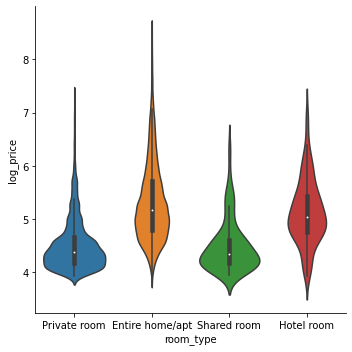

In [59]:
sns.catplot(x="room_type", y="log_price", 
               data=df, kind="violin")

The violin plot shows that private room and shared room are relatively low in price while entire home/apt and hotel room are relatively high in price.

### accommodates

  0%|                                                                                          | 0/107 [00:00<…


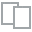
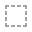
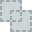
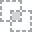
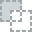
...
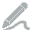
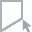
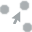
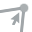
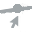

In [60]:
plot(df,'accommodates')

the `accommodates` are right-skewed.

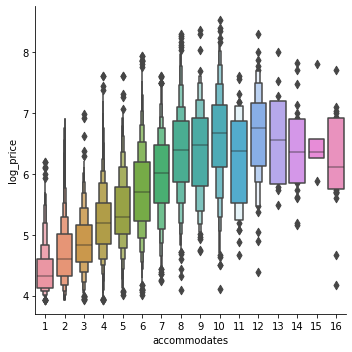

In [61]:
sns.catplot(x="accommodates", y="log_price", 
               data=df, kind="boxen")

From the boxplot, it is observed that when accommodates are less than 10, the price has approxiamtely positive linear relationship with accommodates. Accommodations with more than 10 accommodates has no obvious relationship with price.

In [62]:
# this line is left blank deliberately
# accommodates larger than 10 can be clustered.
pass

### bathrooms_text

In [63]:
df.bathrooms_text.unique()

array(['1 shared bath', '3.5 baths', '1 bath', '1 private bath',
       '1.5 baths', '2 baths', '2.5 baths', '3 baths', '2 shared baths',
       '2.5 shared baths', '5.5 baths', '1.5 shared baths',
       '3 shared baths', '4 baths', '4.5 baths', '6 shared baths',
       '0 shared baths', nan, '5 shared baths', '18 baths', '6 baths',
       'Private half-bath', '5 baths', '0 baths', '4 shared baths',
       'Half-bath', 'Shared half-bath', '18 shared baths',
       '3.5 shared baths', '10 baths', '4.5 shared baths',
       '7 shared baths', '5.5 shared baths', '8 baths'], dtype=object)

In [64]:
df.bathrooms_text = df.bathrooms_text.fillna(0)

the `bathrooms_text` can also be treated the same way as `property_type`, which can be devided to numbers and adjectives. NLP models will be used.

### bedrooms, beds, amenities

In [65]:
df.bedrooms.value_counts()

1.0     10496
2.0      4940
3.0      2023
4.0      1122
5.0       381
6.0        60
7.0         9
10.0        2
8.0         1
16.0        1
12.0        1
Name: bedrooms, dtype: int64

It is considered that `na` means no bedroom.

In [66]:
df.bedrooms = df.bedrooms.fillna(0)

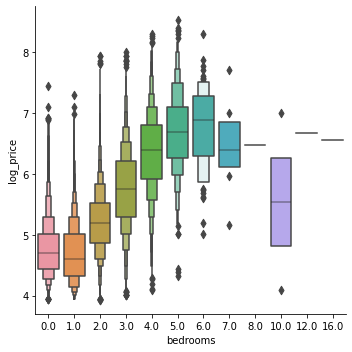

In [67]:
sns.catplot(x="bedrooms", y="log_price", 
               data=df, kind="boxen")

The pattern of the relationship between price and bedrooms are quite similar to the one with accommodates.

Text(0, 0.5, 'accommodates')

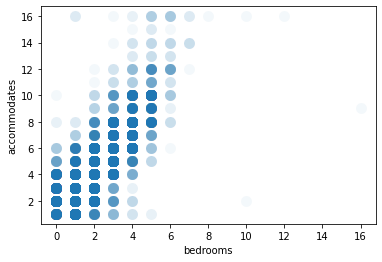

In [68]:
plt.scatter(df.bedrooms, df.accommodates,
           linewidths = 0, alpha=.05,
           s = 120)
plt.xlabel('bedrooms')
plt.ylabel('accommodates')

There are obvious positive relationship between number of bedrooms and number of accommodates, which accord with life experience.

In [69]:
df.beds.value_counts()

1.0     9624
2.0     4906
3.0     2290
4.0     1456
5.0      776
0.0      469
6.0      399
7.0      147
8.0       69
9.0       29
10.0      22
11.0       8
16.0       5
12.0       5
13.0       5
14.0       1
15.0       1
17.0       1
19.0       1
Name: beds, dtype: int64

In [70]:
df.beds = df.beds.fillna(0)

<AxesSubplot:xlabel='beds', ylabel='log_price'>

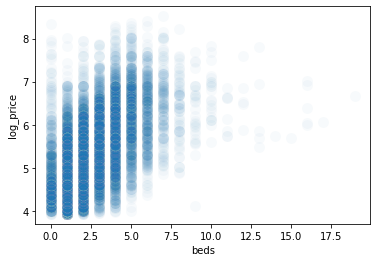

In [71]:
sns.scatterplot(data = df, x = 'beds', y = 'log_price',
           linewidths = 0, alpha=.03,
           s = 120)

It is observed that there is also weak positive relationship between beds and log_price

In [72]:
# convert the amenities column from string to list.
df.amenities = df.amenities.apply(lambda x: x.strip("[]").replace("'","").split(","))

In [73]:
# try to get all the unique items in the amenities list.
def GetAme(x):
    """
    This function takes one parameter which should be a 2-times-nested list(list of lists)
    Return with a list with all the non-repeated items in the deepest list
    """
    AmeList = []
    for AnObservation in x:
        for item in AnObservation:
            if item.strip().strip('"') not in AmeList:
                AmeList.append(item.strip().strip('"'))
    return AmeList

print(len(GetAme(df.amenities)))

623


In [74]:
GetAme(df.amenities)[:20]

['Washer',
 'Iron',
 'Hot water',
 'Essentials',
 'Kitchen',
 'Shampoo',
 'Wifi',
 'Hair dryer',
 'TV',
 'Patio or balcony',
 'Garden or backyard',
 'Lockbox',
 'Children\\u2019s books and toys',
 'Bed linens',
 'Heating',
 'Changing table',
 'Free parking on premises',
 'Smoke alarm',
 'Cooking basics',
 'Baby bath']

There are 623 unique items in the Amenities list.

The Amenities are entered in human language, which could implement NLP to convert into usable information. 

In [75]:
# this line is left blank deliberately
# word2vec can be tried here
pass

## 2.8. Availability features



### nights related features
Including :
```py
['minimum_nights','maximum_nights','minimum_minimum_nights',
 'maximum_minimum_nights','minimum_maximum_nights','maximum_maximum_nights',
 'minimum_nights_avg_ntm','maximum_nights_avg_ntm']
```

Related airbnb minimum night stay explanation:
https://www.airdna.co/blog/whats-the-best-minimum-night-stay-policy-on-airbnb

Host can set minimum nights and maximum nights a customer can book for the accommodation. And such setting can vary in different period of time during the year, indicating a high/low season or the availability of the host. 

Longer minimum nights sometimes means lower price as the host will not have to bother in introducing and settling the accommodation.

Based on life experience, in the high season, if there are strategy in changing the settings of the minimum nights and maximum nights, minimum nights and maximum nights will be shorter, and the opposite in the low season. 

`minimum_nights_avg_ntm` and `maximum_nights_avg_ntm` might be good predictors as it is the weighted average of the number of nights setting.

In [76]:
def ClassifyNights(x):
    if x <= 7:
        return 'within a week'
    elif x <= 30:
        return 'within a month'
    elif x <= 365:
        return 'within a year'
    else:
        return 'more than a year'

df['cate_min_nights'] = df.minimum_nights_avg_ntm.apply(ClassifyNights)

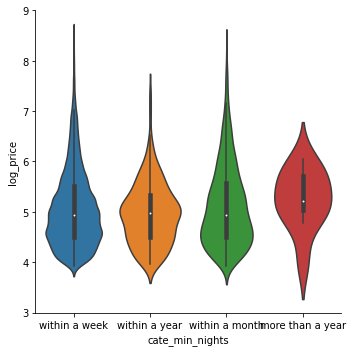

In [77]:
sns.catplot(x="cate_min_nights", y="log_price", 
               data=df, kind="violin")

In [78]:
df['cate_max_nights'] = df.maximum_nights_avg_ntm.apply(ClassifyNights)

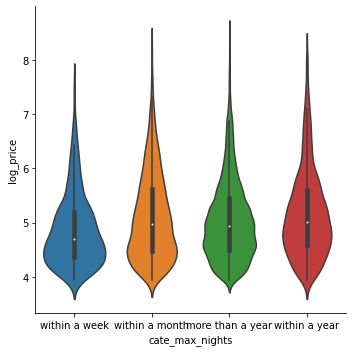

In [79]:
sns.catplot(x="cate_max_nights", y="log_price", 
               data=df, kind="violin")

Based on the two plots, there is no big difference in price with different settings of minimum nights and maximum nights.

### availability

including:
```py
['has_availability','availability_30','availability_60',
 'availability_90','availability_365','instant_bookable']
```



In [80]:
df[['has_availability','availability_30','availability_60',
    'availability_90','availability_365','instant_bookable']].sample(5)

,has_availability,availability_30,availability_60,availability_90,availability_365,instant_bookable
6984,t,0,0,0,9,f
16022,t,28,58,88,88,f
13980,t,0,0,0,0,f
17090,t,0,0,0,0,f
13902,t,23,53,83,358,f


In [81]:
# converting t/f to 1/0
df.has_availability = df.has_availability.map({'t': 1, 'f': 0})
df.instant_bookable = df.instant_bookable.map({'t': 1, 'f': 0})

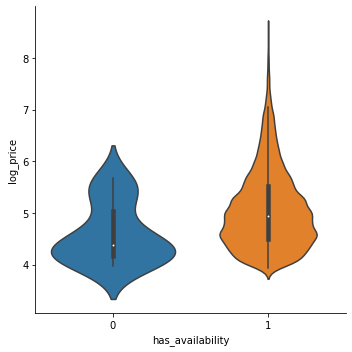

In [82]:
sns.catplot(x="has_availability", y="log_price",
               data=df, kind="violin")

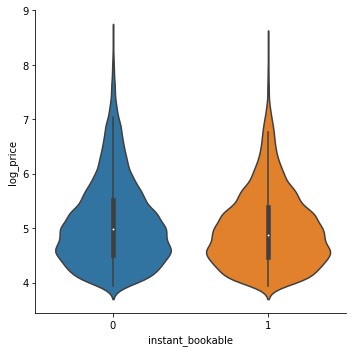

In [83]:
sns.catplot(x="instant_bookable", y="log_price", 
               data=df, kind="violin")

Regarding the two binary variables, price of accommodation which has availability are relatively higher. And whether it is instant bookable has no obvious relationship to price.

The availability in different time scale are indicators of whether the accommodation is popular or not. Less availability days are considered as more popular based on common sense. 

`availability_365` is considered as a robust indicator, `availability_30` can be used to compare with `availability_365` (in terms of ratio)to infer whether it is high/low season of the year.

<AxesSubplot:xlabel='availability_365', ylabel='log_price'>

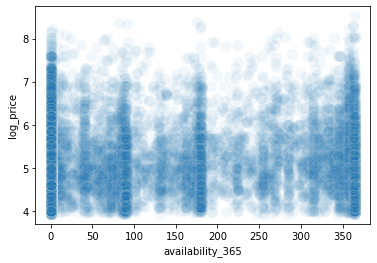

In [84]:
sns.scatterplot(data = df, x = 'availability_365', y = 'log_price',
           linewidths = 0, alpha=.06,
           s = 120)

The plot shows that there is no obvious relationship between availability_365 and price.

In [85]:
# construct a new variable: if ratio of availability in 30 days are greater than ratio of 365, it's true,
# otherwise it's false
df['avail_high'] = (df['availability_365']/365) > (df['availability_30']/30)
df['avail_high'] = df['avail_high'].apply(int)

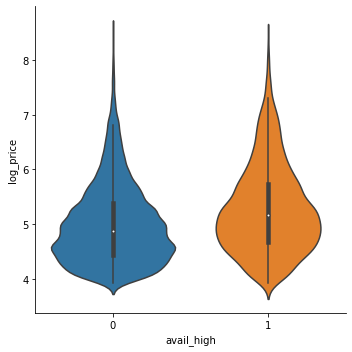

In [86]:
sns.catplot(x="avail_high", y="log_price", 
               data=df, kind="violin")

The plot shows that there is some difference in price whether ratio of availability are high/low in the recent month.

## 2.9. Review related features



In [87]:
df[ReviRelaQuery].sample(5)

,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
5804,3,0,0,2015-07-10,2015-10-24,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.04
4147,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6859,62,9,0,2016-02-18,2021-01-01,93.0,10.0,9.0,10.0,10.0,10.0,10.0,1.02
14584,6,3,0,2019-11-15,2020-02-14,93.0,9.0,9.0,10.0,10.0,10.0,9.0,0.40
12673,1,0,0,2018-01-09,2018-01-09,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0.03


In [88]:
# first review and last review has no meaning. drop them.
df = df.drop("first_review", axis = 1)
df = df.drop("last_review", axis = 1)

  0%|                                                                                          | 0/107 [00:00<…


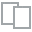
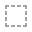
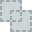
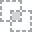
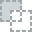
...
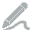
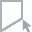
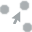
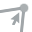
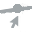

In [89]:
plot(df,'number_of_reviews')

  0%|                                                                                          | 0/107 [00:00<…


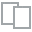
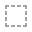
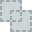
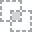
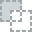
...
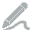
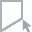
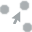
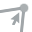
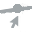

In [90]:
plot(df,'number_of_reviews_ltm')

  0%|                                                                                          | 0/107 [00:00<…


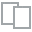
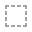
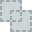
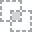
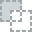
...
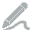
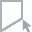
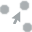
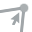
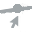

In [91]:
plot(df,'number_of_reviews_l30d')

There is many zeros in `number_of_reviews_l30d` and `number_of_reviews_ltm`, which makes them sparse variables.


<AxesSubplot:xlabel='number_of_reviews_l30d', ylabel='log_price'>

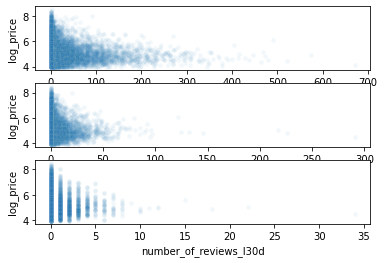

In [92]:
fig, axes = plt.subplots(3, 1)

sns.scatterplot(ax = axes[0], data = df, x = 'number_of_reviews', y = 'log_price',
           linewidths = 0, alpha=.06,
           s = 20)

sns.scatterplot(ax = axes[1], data = df, x = 'number_of_reviews_ltm', y = 'log_price',
           linewidths = 0, alpha=.06,
           s = 20)

sns.scatterplot(ax = axes[2], data = df, x = 'number_of_reviews_l30d', y = 'log_price',
           linewidths = 0, alpha=.06,
           s = 20)

There is no obvious relationship between number of reviews and price from 3 plots above.

It is mentioned in missing value overview that missing value in review_related predictors are highly correlated, because some accommodation has no reviews, making other columns having no values.

In [93]:
# construct a new column: if there is no review, value is 1, otherwise the value is 0.
df["review_isna"] = df['number_of_reviews'] == 0
df["review_isna"] = df["review_isna"].apply(int)


In [94]:
# fill the na in the rest of columns with 0.
ReviMissCols = ['review_scores_rating','review_scores_accuracy','review_scores_cleanliness',
                'review_scores_checkin','review_scores_communication','review_scores_location',
                'review_scores_value','reviews_per_month']
for acol in ReviMissCols:
    df[acol] = df[acol].fillna(0)


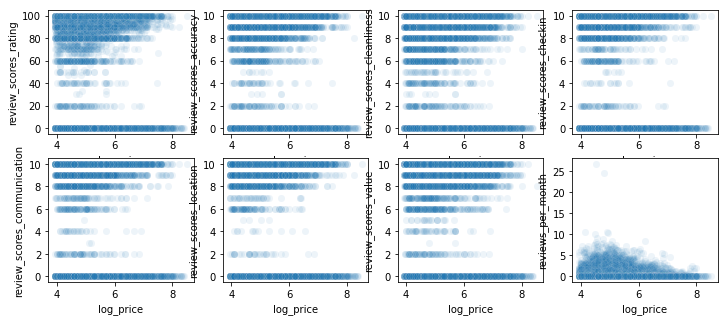

In [95]:
fig, axes = plt.subplots(2, 4,figsize = (12,5))
for i,acol in enumerate(ReviMissCols):
    sns.scatterplot(ax = axes[i//4,i%4], data = df, x = 'log_price', y = acol,
           linewidths = 0, alpha=.08,
           s = 50)

It is observed that accommodation with low rating has lower price, but high rating accommodation can still be cheap. But low_rating and high-price accommodation are extremely rare. (The observation excludes the 0 rating value.)

## 2.10. Listing related features



In [96]:
df[ListRelaQuery]

,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,2,0,2,0
1,1,1,0,0
2,1,1,0,0
3,1,0,1,0
4,189,189,0,0
...,...,...,...,...
20403,2,2,0,0
20404,8,8,0,0
20405,1,1,0,0
20406,1,1,0,0


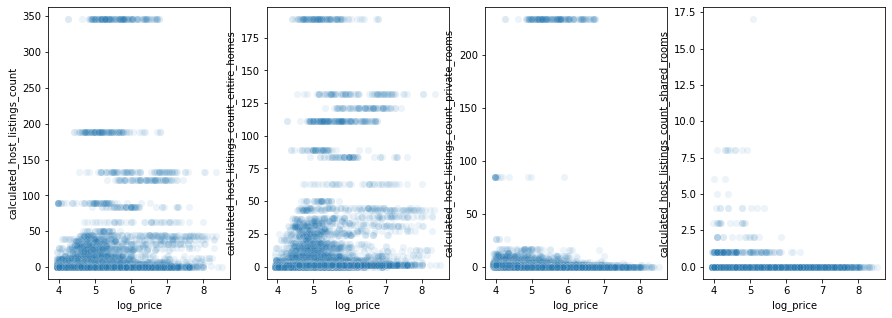

In [97]:
fig, axes = plt.subplots(1, 4,figsize = (15,5))
for i,acol in enumerate(ListRelaQuery):
    sns.scatterplot(ax = axes[i], data = df, x = 'log_price', y = acol,
           linewidths = 0, alpha=.08,
           s = 50)

These four columns have no strong relationship with price both in visual and in meaning, which means can be dropped.

In [98]:
for acol in ListRelaQuery:
    df = df.drop(acol, axis = 1)

## 2.11. Wrap-up

- [DataClean] `neighbourhood_group_cleansed` is removed as this is an empty column.
- [EDA] 2 missing value plots are drawn to get an overview.
- [EDA] the whole data set can be devided into several segments by meaning.
---
price
- [DataClean] convert the price column (string -> float)
- [DataClean] construct `log_price`
- [EDA] univariate EDA - `price`
---
basic info
- [EDA] understanding `name`,`description`
- [DataClean] construct column - `description_isna` ; drop `name` and `description` 
---
host related
- [EDA] understand `host_name` - it is not unique to every host.
- [DataClean] drop `host_name`
- [DataClean] convert `host_since` to number of days
- [EDA] univariate EDA - `host_since`
- [DataClean] drop `host_location`
- [DataClean] construct `host_about_isna`; drop `host_about`
- [DataClean] convert 'host_response_rate' and 'host_acceptance_rate' into int
- [EDA] understanding 'host_response_rate' and 'host_acceptance_rate'
- [DataClean] fill na values in 'host_response_rate', 'host_acceptance_rate', 'host_response_time'
- [EDA] plotting relationship between `host_response_time` and `price`
- [DataClean] convert `host_is_superhost` into binary variable
- [EDA] saparating the `price` by `host_is_superhost` and plotting with histogram; ttest not significant
- [EDA] `host_listings_count` has the same values with `host_total_listings_count`
- [DataClean] drop `host_total_listings_count`
- [EDA] understanding 'host_listings_count'. saparate with 1, t-test significant.
- [DataClean] convert `host_verifications` into list
- [DataClean] convert `host_identity_verified` into binary variable
- [EDA] understanding `host_identity_verified` and `host_verifications` 
---
location related
- [DataClean] drop `host_neighbourhood` and `neighbourhood`
- [EDA] understanding neighbourhood_cleansed
- [EDA] plotting prices with `latitude` and longitude`
- [DataClean] drop `neighborhood_overview`
---
accommodation related
- [EDA] understanding `property_type`
- [EDA] understanding `room_type`; plotting the relationship with price
- [EDA] univariate EDA - `accommodates`; plotting the relationship with price
- [EDA] understanding `bathrooms_text`
- [EDA] univariate EDA - `bedrooms` ; plotting the relationship with price
- [DataClean] fill na value in `bedrooms`,`beds`, `bathrooms_text` with 0
- [EDA] bivariate EDA - `bedrooms` and `accommodates`
- [EDA] univariate EDA - `beds` ; plotting the relationship with price
- [DataClean] convert `amenities` into list
- [EDA] understanding `amenities`
---
availability
- [DataClean] construct `cate_min_nights` by categorizing `minimum_nights_avg_ntm` into 4 categorites
- [DataClean] construct `cate_max_nights` by categorizing `maximum_nights_avg_ntm` into 4 categorites
- [EDA] plotting the relationship with price (with variables constructed above) - no big difference
- [Dataclean] convert `has_availability` and `instant_bookable` into binary variables.
- [EDA] plotting the relationship with price (with 2 variables above)
- [EDA] plotting the relationship between 'availability_365' and price
- [DateClean] construct `avail_high` indicating a high season. [EDA] plot with price
---
review related
- [DataClean] drop `first_review` and `last_review`
- [EDA] understanding `number_of_reviews`, `number_of_reviews_ltm`, `number_of_reviews_l30d`
- [DataClean] construct `review_isna`
- [DataClean] fill na value in review related columns with 0
- [EDA] plotting review related columns with price
---
list related
- [Dataclean] understand and drop all the related columns.

In [99]:
# do all the same pre-process to the test data set
test = pd.read_csv("test.csv")
# useless column
test = test.drop('neighbourhood_group_cleansed', axis = 1)
# price -- test data set does not have price

# basic info
test['description_isna'] = test.description.isna().astype(int)
test = test.drop(BasiInfoQuery, axis =1)
# host related
test = test.drop('host_name', axis =1)
test['host_since'] = pd.to_datetime(test['host_since'])
test['host_since'] = test['host_since'].apply(lambda x:(pd.to_datetime('2021-09-23')-x).days)
test = test.drop('host_location', axis =1)
test['host_about_isna'] = test.host_about.isna().astype(int)
test = test.drop('host_about', axis = 1)
test['host_response_rate']=test['host_response_rate'][test['host_response_rate'].isna()==False].apply(lambda x:int(x[:-1]))
test['host_acceptance_rate']=test['host_acceptance_rate'][test['host_acceptance_rate'].isna()==False].apply(lambda x:int(x[:-1]))
test['host_response_rate_isna'] = test['host_response_rate'].isna().astype(int)
test['host_acceptance_rate_isna'] =  test['host_acceptance_rate'].isna().astype(int)
test['host_response_rate'][test['host_response_rate'].isna()] = 0
test['host_acceptance_rate'][test['host_acceptance_rate'].isna()] = 0
test['host_response_time'][test['host_response_time'].isna()] = 'no response'
test.host_is_superhost = test.host_is_superhost.map({'t': 1, 'f': 0})
test = test.drop('host_total_listings_count', axis = 1)
test.host_verifications = test.host_verifications.apply(lambda x: x.strip("[]").replace("'","").split(","))
test.host_identity_verified = test.host_identity_verified.map({'t': 1, 'f': 0})
test['num_host_verification'] = test.host_verifications.apply(len)
# location related
test = test.drop("host_neighbourhood", axis =1)
test = test.drop("neighbourhood", axis =1)
test = test.drop("neighborhood_overview", axis =1)
# accommodation related
test.bathrooms_text = test.bathrooms_text.fillna(0)
test.beds = test.beds.fillna(0)
test.bedrooms = test.bedrooms.fillna(0)
test.amenities = test.amenities.apply(lambda x: x.strip("[]").replace("'","").split(","))
# availability
test['cate_min_nights'] = test.minimum_nights_avg_ntm.apply(ClassifyNights)
test['cate_max_nights'] = test.maximum_nights_avg_ntm.apply(ClassifyNights)
test.has_availability = test.has_availability.map({'t': 1, 'f': 0})
test.instant_bookable = test.instant_bookable.map({'t': 1, 'f': 0})
test['avail_high'] = (test['availability_365']/365) > (test['availability_30']/30)
test['avail_high'] = test['avail_high'].apply(int)
# review related
test = test.drop("first_review", axis = 1)
test = test.drop("last_review", axis = 1)
test["review_isna"] = test['number_of_reviews'] == 0
test["review_isna"] = test["review_isna"].apply(int)
for acol in ReviMissCols:
    test[acol] = test[acol].fillna(0)
# listing related
for acol in ListRelaQuery:
    test = test.drop(acol, axis = 1)

test = test.drop('id', axis = 1)

In [100]:
# examine whether columns are correct.
trainList = list(df.columns)
trainList.remove('price')
trainList.remove('log_price')
print(trainList == list(test.columns))

True


In [101]:
train = df.copy()

`train` - the training dataset dataframe after data cleaning process (with `price` and `log_price`)

`test` - the test dataset dataframe after data cleaning process (without `price` and `log_price`)

In [102]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20408 entries, 0 to 20407
Data columns (total 54 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   host_since                   20408 non-null  int64  
 1   host_response_time           20408 non-null  object 
 2   host_response_rate           20408 non-null  float64
 3   host_acceptance_rate         20408 non-null  float64
 4   host_is_superhost            20408 non-null  int64  
 5   host_listings_count          20408 non-null  float64
 6   host_verifications           20408 non-null  object 
 7   host_identity_verified       20408 non-null  int64  
 8   neighbourhood_cleansed       20408 non-null  object 
 9   latitude                     20408 non-null  float64
 10  longitude                    20408 non-null  float64
 11  property_type                20408 non-null  object 
 12  room_type                    20408 non-null  object 
 13  accommodates    

In [103]:
train.to_csv('traindf.csv')
test.to_csv("testdf.csv")

In [104]:
# read in the cleansed data
train = pd.read_csv("traindf.csv")
test = pd.read_csv("testdf.csv")

In [105]:
# drop the useless column
train = train.drop("Unnamed: 0", axis =1)
test = test.drop("Unnamed: 0", axis =1)

# 3. Feature Engineering

## 3.1. Handling natural languages

some columnms are cleaned but still human-language-expressed:


### property_type

In [106]:
train.property_type.unique()

array(['Private room in house', 'Entire house', 'Entire apartment',
       'Private room in apartment', 'Private room in bed and breakfast',
       'Private room in condominium', 'Entire townhouse', 'Entire loft',
       'Entire serviced apartment', 'Entire condominium',
       'Room in boutique hotel', 'Entire guesthouse',
       'Shared room in house', 'Entire villa',
       'Private room in townhouse', 'Boat', 'Private room in guest suite',
       'Entire guest suite', 'Entire cabin', 'Shared room in apartment',
       'Entire cottage', 'Private room in cottage', 'Room in aparthotel',
       'Earth house', 'Room in hostel', 'Private room in villa',
       'Room in hotel', 'Entire bungalow', 'Tiny house', 'Barn',
       'Entire floor', 'Private room in serviced apartment',
       'Entire home/apt', 'Room in serviced apartment',
       'Private room in earth house', 'Private room in guesthouse',
       'Private room in bungalow', 'Shared room in townhouse',
       'Entire chalet', 'Pr

This feature descibes the type of the property. However, types are expressed with human language. 
The description can be devided by its word class: 

1) adjective: 'shared','private','entire',etc. ; 

2) noun: 'apartment','hotel','loft',etc. . 

Therefore, with clear pattern, NLP models are not necessarily implemented, it is processed by code below.

In [107]:
property_word_totallist = []
for AnObs in train.property_type:
    AnObs_low = AnObs.lower()
    wordlist = AnObs_low.split(" ")
    for aword in wordlist:
        if aword not in property_word_totallist:
            property_word_totallist.append(aword)

In [108]:
train['property_type_wdlist'] = train.property_type.apply(lambda x:x.lower().split(" "))

In [109]:
test['property_type_wdlist'] = test.property_type.apply(lambda x:x.lower().split(" "))

In [110]:
for i, testword in enumerate(property_word_totallist):
    train['property_' + testword] = train['property_type_wdlist'].apply(lambda x:int(testword in x))
    test['property_' + testword] = test['property_type_wdlist'].apply(lambda x:int(testword in x))
    property_word_totallist[i] = 'property_'+ testword

In [111]:
# create a list for selected features
SelectedFeature = []

In [112]:
# include the constructed columns

for afeature in property_word_totallist:
    SelectedFeature.append(afeature)

### bathrooms_text

In [113]:
train.bathrooms_text.unique()

array(['1 shared bath', '3.5 baths', '1 bath', '1 private bath',
       '1.5 baths', '2 baths', '2.5 baths', '3 baths', '2 shared baths',
       '2.5 shared baths', '5.5 baths', '1.5 shared baths',
       '3 shared baths', '4 baths', '4.5 baths', '6 shared baths',
       '0 shared baths', '0', '5 shared baths', '18 baths', '6 baths',
       'Private half-bath', '5 baths', '0 baths', '4 shared baths',
       'Half-bath', 'Shared half-bath', '18 shared baths',
       '3.5 shared baths', '10 baths', '4.5 shared baths',
       '7 shared baths', '5.5 shared baths', '8 baths'], dtype=object)

In [114]:
bath_word_totallist = []
for AnObs in train.bathrooms_text:
    AnObs_low = AnObs.lower()
    wordlist = AnObs_low.split(" ")
    for aword in wordlist:
        if aword not in bath_word_totallist:
            bath_word_totallist.append(aword)
bath_word_totallist

['1',
 'shared',
 'bath',
 '3.5',
 'baths',
 'private',
 '1.5',
 '2',
 '2.5',
 '3',
 '5.5',
 '4',
 '4.5',
 '6',
 '0',
 '5',
 '18',
 'half-bath',
 '10',
 '7',
 '8']

In [115]:
def bathnum(AnObs):
    wordlist = AnObs.lower().replace("half","0.5").replace("-"," ").split(" ")
    for awd in wordlist:
        try:
            anum = float(awd)
            return anum
        except:
            continue

train['number_of_baths']= train['bathrooms_text'].apply(bathnum)
test['number_of_baths']= test['bathrooms_text'].apply(bathnum)

def bathprivate(AnObs):
    wordlist = AnObs.lower().replace("half","0.5").replace("-"," ").split(" ")
    if 'private' in wordlist:
        return 1
    else:
        return 0

train["bath_private"] = train['bathrooms_text'].apply(bathprivate)
test["bath_private"] = test['bathrooms_text'].apply(bathprivate)

def bathshared(AnObs):
    wordlist = AnObs.lower().replace("half","0.5").replace("-"," ").split(" ")
    if 'shared' in wordlist:
        return 1
    else:
        return 0
    
train["bath_shared"] = train['bathrooms_text'].apply(bathshared)
test["bath_shared"] = test['bathrooms_text'].apply(bathshared)

In [116]:
SelectedFeature.append('number_of_baths')
SelectedFeature.append('bath_private')
SelectedFeature.append('bath_shared')

### amenities
As is mentioned in EDA, this column contains more complicated natural language.

In [117]:
train.amenities = train.amenities.apply(lambda x: x.lower().strip("[]").replace("'","").replace('"',"").strip().split(",  "))
test.amenities = test.amenities.apply(lambda x: x.lower().strip("[]").replace("'","").replace('"',"").strip().split(",  "))

In [118]:
def GetAme(x):
    """
    This function takes one parameter which should be a 2-times-nested list(list of lists)
    Return with a list with all the non-repeated items in the deepest list
    """
    AmeList = []
    for AnObservation in x:
        for item in AnObservation:
            if item.strip() not in AmeList:
                AmeList.append(item.strip())
    return AmeList

Amenity_list = GetAme(train.amenities)

print(len(Amenity_list))

598


There are 598 unique items, which means constructing a new individual column for each item is not a good solution.

In [119]:
item_dict = {}
for item in Amenity_list:
    counter = 0
    for AnObs in train.amenities:
        if item in AnObs:
            counter += 1
    item_dict[item.strip()] = counter

In [120]:
freq_ame_list=[]
for akey in item_dict.keys():
    if item_dict[akey] >= 30: # 30 can be modified, the larger, the generalisation would be better.
        freq_ame_list.append(akey)

In [121]:
len(freq_ame_list)

120

Items of which occurance are greater than 30 times are culculated and counted in new columns. 

In [122]:
for i, aitem in enumerate(freq_ame_list):
    train['Amenity_' + aitem] = train.amenities.apply(lambda x : int(aitem in x))
    test['Amenity_' + aitem] = test.amenities.apply(lambda x : int(aitem in x))
    freq_ame_list[i] = 'Amenity_' + aitem


for afeature in freq_ame_list:
    SelectedFeature.append(afeature)

## 3.2. Encoding categorical data
including :
host_response_time, neighbourhood_cleansed, room_type, 

### host_response_time

In [123]:
train.host_response_time.unique()

array(['no response', 'within an hour', 'within a day',
       'within a few hours', 'a few days or more'], dtype=object)

In [124]:
train.neighbourhood_cleansed.unique()

array(['Sydney', 'Parramatta', 'Ashfield', 'Ryde', 'Woollahra',
       'Leichhardt', 'Burwood', 'Rockdale', 'Waverley', 'Holroyd',
       'Randwick', 'Marrickville', 'Botany Bay', 'Canada Bay', 'Manly',
       'Warringah', 'North Sydney', 'Sutherland Shire', 'The Hills Shire',
       'Willoughby', 'Penrith', 'Hunters Hill', 'Mosman', 'Pittwater',
       'Blacktown', 'Canterbury', 'Bankstown', 'Ku-Ring-Gai', 'Lane Cove',
       'Hornsby', 'Auburn', 'Strathfield', 'Campbelltown', 'Hurstville',
       'Liverpool', 'City Of Kogarah', 'Fairfield', 'Camden'],
      dtype=object)

In [125]:
train.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room', 'Hotel room'],
      dtype=object)

In [126]:
cate_col = ['host_response_time', 'neighbourhood_cleansed', 'room_type']
OHEnc = OneHotEncoder(sparse = False)

OHcols = pd.DataFrame(OHEnc.fit_transform(train[cate_col]), columns = OHEnc.get_feature_names())
OHcols_test = pd.DataFrame(OHEnc.transform(test[cate_col]), columns = OHEnc.get_feature_names())

othercols = train.drop(cate_col,axis =1)
othercols_test = test.drop(cate_col,axis =1)

train = pd.concat([OHcols,othercols],axis =1)
test = pd.concat([OHcols_test,othercols_test],axis =1)

In [127]:
ohcols_names = OHEnc.get_feature_names().tolist()

In [128]:
for afeature in ohcols_names:
    SelectedFeature.append(afeature)

In [129]:
#other selected variables
other_selected_col_list = ['host_since','host_response_rate','host_acceptance_rate',
                           'host_is_superhost','host_listings_count','host_identity_verified',
                           'latitude','longitude','accommodates',
                           'bedrooms','beds','minimum_nights_avg_ntm','maximum_nights_avg_ntm',
                           'has_availability','availability_30','availability_365','number_of_reviews',
                           'review_scores_rating','review_scores_location',
                           'review_scores_value','instant_bookable','description_isna',
                           'host_about_isna','host_response_rate_isna','host_acceptance_rate_isna',
                           'avail_high','review_isna']

In [130]:
for afeature in other_selected_col_list:
    SelectedFeature.append(afeature)

In [131]:
SelectedFeature

['property_private',
 'property_room',
 'property_in',
 'property_house',
 'property_entire',
 'property_apartment',
 'property_bed',
 'property_and',
 'property_breakfast',
 'property_condominium',
 'property_townhouse',
 'property_loft',
 'property_serviced',
 'property_boutique',
 'property_hotel',
 'property_guesthouse',
 'property_shared',
 'property_villa',
 'property_boat',
 'property_guest',
 'property_suite',
 'property_cabin',
 'property_cottage',
 'property_aparthotel',
 'property_earth',
 'property_hostel',
 'property_bungalow',
 'property_tiny',
 'property_barn',
 'property_floor',
 'property_home/apt',
 'property_chalet',
 'property_resort',
 'property_camper/rv',
 'property_treehouse',
 'property_farm',
 'property_stay',
 'property_place',
 'property_tent',
 'property_yurt',
 'property_pension',
 'property_train',
 'property_cave',
 'property_island',
 'property_dome',
 'number_of_baths',
 'bath_private',
 'bath_shared',
 'Amenity_washer',
 'Amenity_iron',
 'Amenity_hot 

In [132]:
train[SelectedFeature].sample(5, random_state = 42)

,property_private,property_room,property_in,property_house,property_entire,property_apartment,property_bed,property_and,property_breakfast,property_condominium,property_townhouse,property_loft,property_serviced,property_boutique,property_hotel,property_guesthouse,property_shared,property_villa,property_boat,property_guest,property_suite,property_cabin,property_cottage,property_aparthotel,property_earth,property_hostel,property_bungalow,property_tiny,property_barn,property_floor,property_home/apt,property_chalet,property_resort,property_camper/rv,property_treehouse,property_farm,property_stay,property_place,property_tent,property_yurt,property_pension,property_train,property_cave,property_island,property_dome,number_of_baths,bath_private,bath_shared,Amenity_washer,Amenity_iron,Amenity_hot water,Amenity_essentials,Amenity_kitchen,Amenity_shampoo,Amenity_wifi,Amenity_hair dryer,Amenity_tv,Amenity_patio or balcony,Amenity_garden or backyard,Amenity_lockbox,Amenity_children\\u2019s books and toys,Amenity_bed linens,Amenity_heating,Amenity_changing table,Amenity_free parking on premises,Amenity_smoke alarm,Amenity_cooking basics,Amenity_baby bath,Amenity_extra pillows and blankets,Amenity_dishwasher,Amenity_oven,Amenity_stove,Amenity_microwave,Amenity_bbq grill,Amenity_air conditioning,Amenity_dryer,Amenity_dedicated workspace,Amenity_dishes and silverware,Amenity_hangers,Amenity_baby monitor,Amenity_bathtub,Amenity_refrigerator,Amenity_long term stays allowed,Amenity_elevator,Amenity_host greets you,Amenity_lock on bedroom door,Amenity_coffee maker,Amenity_fire extinguisher,Amenity_room-darkening shades,Amenity_first aid kit,Amenity_private entrance,Amenity_carbon monoxide alarm,Amenity_gym,Amenity_paid parking off premises,Amenity_cable tv,Amenity_shower gel,Amenity_free street parking,Amenity_pool,Amenity_breakfast,Amenity_freezer,Amenity_conditioner,Amenity_keypad,Amenity_crib,Amenity_high chair,Amenity_cleaning before checkout,Amenity_hot tub,Amenity_luggage dropoff allowed,Amenity_indoor fireplace,Amenity_waterfront,Amenity_ethernet connection,Amenity_beachfront,Amenity_body soap,Amenity_sound system,Amenity_ceiling fan,Amenity_laundromat nearby,Amenity_smart lock,Amenity_single level home,Amenity_children\\u2019s dinnerware,Amenity_pack \\u2019n play/travel crib,Amenity_cleaning products,Amenity_baking sheet,Amenity_barbecue utensils,Amenity_pour-over coffee,Amenity_nespresso machine,Amenity_stainless steel oven,Amenity_ev charger,Amenity_portable fans,Amenity_beach essentials,Amenity_window guards,Amenity_babysitter recommendations,Amenity_portable heater,Amenity_paid parking on premises,Amenity_rice maker,Amenity_drying rack for clothing,Amenity_wine glasses,Amenity_dining table,Amenity_toaster,Amenity_clothing storage: wardrobe,Amenity_outdoor dining area,Amenity_outdoor furniture,Amenity_hot water kettle,Amenity_outlet covers,Amenity_full kitchen,Amenity_bathroom essentials,Amenity_bedroom comforts,Amenity_building staff,Amenity_private living room,Amenity_bread maker,Amenity_game console,Amenity_trash compactor,Amenity_lake access,Amenity_mini fridge,Amenity_pocket wifi,Amenity_baby safety gates,Amenity_self check-in,Amenity_dryer \\u2013 in building,Amenity_central air conditioning,Amenity_washer \\u2013\\u00a0in building,Amenity_clothing storage,Amenity_fireplace guards,Amenity_gas stove,Amenity_washer \\u2013\\u00a0in unit,Amenity_dryer \\u2013\\u00a0in unit,Amenity_piano,Amenity_board games,Amenity_central heating,Amenity_table corner guards,Amenity_electric stove,x0_a few days or more,x0_no response,x0_within a day,x0_within a few hours,x0_within an hour,x1_Ashfield,x1_Auburn,x1_Bankstown,x1_Blacktown,x1_Botany Bay,x1_Burwood,x1_Camden,x1_Campbelltown,x1_Canada Bay,x1_Canterbury,x1_City Of Kogarah,x1_Fairfield,x1_Holroyd,x1_Hornsby,x1_Hunters Hill,x1_Hurstville,x1_Ku-Ring-Gai,x1_Lane Cove,x1_Leichhardt,x1_Liverpool,x1_Manly,x1_Marrickville,x1_Mosman,x1_North Sydney,x1_Parramatta,x1_Penrith,x1_Pittwater,x1_Randwick,x

In [133]:
test[SelectedFeature].sample(5, random_state = 42)

,property_private,property_room,property_in,property_house,property_entire,property_apartment,property_bed,property_and,property_breakfast,property_condominium,property_townhouse,property_loft,property_serviced,property_boutique,property_hotel,property_guesthouse,property_shared,property_villa,property_boat,property_guest,property_suite,property_cabin,property_cottage,property_aparthotel,property_earth,property_hostel,property_bungalow,property_tiny,property_barn,property_floor,property_home/apt,property_chalet,property_resort,property_camper/rv,property_treehouse,property_farm,property_stay,property_place,property_tent,property_yurt,property_pension,property_train,property_cave,property_island,property_dome,number_of_baths,bath_private,bath_shared,Amenity_washer,Amenity_iron,Amenity_hot water,Amenity_essentials,Amenity_kitchen,Amenity_shampoo,Amenity_wifi,Amenity_hair dryer,Amenity_tv,Amenity_patio or balcony,Amenity_garden or backyard,Amenity_lockbox,Amenity_children\\u2019s books and toys,Amenity_bed linens,Amenity_heating,Amenity_changing table,Amenity_free parking on premises,Amenity_smoke alarm,Amenity_cooking basics,Amenity_baby bath,Amenity_extra pillows and blankets,Amenity_dishwasher,Amenity_oven,Amenity_stove,Amenity_microwave,Amenity_bbq grill,Amenity_air conditioning,Amenity_dryer,Amenity_dedicated workspace,Amenity_dishes and silverware,Amenity_hangers,Amenity_baby monitor,Amenity_bathtub,Amenity_refrigerator,Amenity_long term stays allowed,Amenity_elevator,Amenity_host greets you,Amenity_lock on bedroom door,Amenity_coffee maker,Amenity_fire extinguisher,Amenity_room-darkening shades,Amenity_first aid kit,Amenity_private entrance,Amenity_carbon monoxide alarm,Amenity_gym,Amenity_paid parking off premises,Amenity_cable tv,Amenity_shower gel,Amenity_free street parking,Amenity_pool,Amenity_breakfast,Amenity_freezer,Amenity_conditioner,Amenity_keypad,Amenity_crib,Amenity_high chair,Amenity_cleaning before checkout,Amenity_hot tub,Amenity_luggage dropoff allowed,Amenity_indoor fireplace,Amenity_waterfront,Amenity_ethernet connection,Amenity_beachfront,Amenity_body soap,Amenity_sound system,Amenity_ceiling fan,Amenity_laundromat nearby,Amenity_smart lock,Amenity_single level home,Amenity_children\\u2019s dinnerware,Amenity_pack \\u2019n play/travel crib,Amenity_cleaning products,Amenity_baking sheet,Amenity_barbecue utensils,Amenity_pour-over coffee,Amenity_nespresso machine,Amenity_stainless steel oven,Amenity_ev charger,Amenity_portable fans,Amenity_beach essentials,Amenity_window guards,Amenity_babysitter recommendations,Amenity_portable heater,Amenity_paid parking on premises,Amenity_rice maker,Amenity_drying rack for clothing,Amenity_wine glasses,Amenity_dining table,Amenity_toaster,Amenity_clothing storage: wardrobe,Amenity_outdoor dining area,Amenity_outdoor furniture,Amenity_hot water kettle,Amenity_outlet covers,Amenity_full kitchen,Amenity_bathroom essentials,Amenity_bedroom comforts,Amenity_building staff,Amenity_private living room,Amenity_bread maker,Amenity_game console,Amenity_trash compactor,Amenity_lake access,Amenity_mini fridge,Amenity_pocket wifi,Amenity_baby safety gates,Amenity_self check-in,Amenity_dryer \\u2013 in building,Amenity_central air conditioning,Amenity_washer \\u2013\\u00a0in building,Amenity_clothing storage,Amenity_fireplace guards,Amenity_gas stove,Amenity_washer \\u2013\\u00a0in unit,Amenity_dryer \\u2013\\u00a0in unit,Amenity_piano,Amenity_board games,Amenity_central heating,Amenity_table corner guards,Amenity_electric stove,x0_a few days or more,x0_no response,x0_within a day,x0_within a few hours,x0_within an hour,x1_Ashfield,x1_Auburn,x1_Bankstown,x1_Blacktown,x1_Botany Bay,x1_Burwood,x1_Camden,x1_Campbelltown,x1_Canada Bay,x1_Canterbury,x1_City Of Kogarah,x1_Fairfield,x1_Holroyd,x1_Hornsby,x1_Hunters Hill,x1_Hurstville,x1_Ku-Ring-Gai,x1_Lane Cove,x1_Leichhardt,x1_Liverpool,x1_Manly,x1_Marrickville,x1_Mosman,x1_North Sydney,x1_Parramatta,x1_Penrith,x1_Pittwater,x1_Randwick,x

# 4. Modeling

## 4.1. Define the data and functions for final modeling

In [134]:
predictors = train[SelectedFeature]
target = train['log_price']
X_test = test[SelectedFeature] # the final y_test is in log_price scale, remember to convert back.

In [135]:
X_train, X_valid, y_train, y_valid = train_test_split(predictors, target, test_size = 0.3, random_state = 42)

In [136]:
def rmsle(y_valid, y_pred):
    return np.sqrt(mean_squared_log_error(np.exp(y_valid), np.exp(y_pred) ))

In [137]:
X_train = X_train.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
X_valid = X_valid.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
X_test = X_test.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [138]:
# log transformed target scorer
rmsle_scorer = make_scorer(rmsle, greater_is_better=False)

In [139]:

def submit_tocsv_adjusted(model, nameofmodel):
    # there are back transformation bias
    ''' this function takes two parameter,
    model - the already fitted model which has .predict() method
    nameofmodel - a string, the name of the model
    '''
    y_hat = model.predict(predictors)
    residuals = target - y_hat
    adj = np.mean(np.exp(residuals))
    final_predict = np.exp(model.predict(X_test)) * adj
    submission = pd.DataFrame(np.c_[test.index, final_predict], columns = ['id','price'])
    submission['id'] = submission['id'].astype('int')
    submission.to_csv('{} model prediction.csv'.format(nameofmodel), index = False)
    print(submission)

## 4.2 Simple Linear Regression - Benchmark

In [140]:
LR = LinearRegression()

kfold = KFold(n_splits= 5 ,shuffle = True, random_state= 42 )
LR_CV_results = cross_val_score(LR, X = predictors, y = target, scoring=rmsle_scorer ,cv=kfold)
print('RMSLE Benchmark with linear regression(cross-validation): {:.6f}'.format(-LR_CV_results.mean()))

RMSLE Benchmark with linear regression(cross-validation): 0.423998


In [141]:
LR.fit(predictors, target)
submit_tocsv_adjusted(LR, 'linearRegression')

        id       price
0        0   88.389509
1        1   84.261764
2        2  181.364500
3        3   97.950314
4        4   72.829754
...    ...         ...
8742  8742   95.486682
8743  8743  108.191370
8744  8744  182.769398
8745  8745  559.132638
8746  8746   76.239910

[8747 rows x 2 columns]


## 4.3. Random Forest Regression

In [142]:
def objective(trial):
    
    n_estimators = trial.suggest_int('n_estimators', 20, 300, step = 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 20, step = 1)
    max_features = trial.suggest_categorical('max_features', ['auto', 'sqrt'])
    max_depth = trial.suggest_int('max_depth', 10, 100, step = 5)
    
    RFmodel = RandomForestRegressor(n_estimators = n_estimators,  
                                  max_features = max_features, 
                                  min_samples_leaf = min_samples_leaf,
                                  max_depth = max_depth,
                                  random_state = 42)
    
    scores = cross_val_score(RFmodel, predictors, target, scoring=rmsle_scorer, cv = kfold)
    
    loss = -np.mean(scores)
    
    return loss

sampler = TPESampler(seed=42) 
study = optuna.create_study(direction='minimize', sampler=sampler)
# the timeout is set to be 30mins
# if you cannot wait that long, please shrink the timeout parameter below
# however, the longer, the more possible the model is well-tuned
study.optimize(objective, n_trials=100, timeout=2400) 

[I 2021-11-12 17:07:50,722] A new study created in memory with name: no-name-c041c44c-d6c2-4b45-bd0a-82bda7e25b38
[I 2021-11-12 17:10:46,587] Trial 0 finished with value: 0.4153211400382969 and parameters: {'n_estimators': 120, 'min_samples_leaf': 20, 'max_features': 'auto', 'max_depth': 20}. Best is trial 0 with value: 0.4153211400382969.
[I 2021-11-12 17:12:42,979] Trial 1 finished with value: 0.4006097036333437 and parameters: {'n_estimators': 60, 'min_samples_leaf': 3, 'max_features': 'auto', 'max_depth': 75}. Best is trial 1 with value: 0.4006097036333437.
[I 2021-11-12 17:13:11,738] Trial 2 finished with value: 0.41734839661336487 and parameters: {'n_estimators': 20, 'min_samples_leaf': 20, 'max_features': 'auto', 'max_depth': 25}. Best is trial 1 with value: 0.4006097036333437.
[I 2021-11-12 17:15:11,763] Trial 3 finished with value: 0.40375769918049864 and parameters: {'n_estimators': 70, 'min_samples_leaf': 7, 'max_features': 'auto', 'max_depth': 35}. Best is trial 1 with valu

In [143]:
RF_params = study.best_params
RF = RandomForestRegressor(**RF_params)
RF_CV_results = cross_val_score(RF,
                                X = predictors,
                                y = target,
                                scoring = rmsle_scorer,
                                cv = kfold)
print('RMSLE of Cross-Validation with tuned Random Forest: {:.6f}'.format(-RF_CV_results.mean()))

RMSLE of Cross-Validation with tuned Random Forest: 0.397689


In [144]:
RF.fit(predictors, target)
submit_tocsv_adjusted(RF, 'RandomForest')

        id       price
0        0   77.668712
1        1   72.464280
2        2  178.612650
3        3   86.517482
4        4   76.507346
...    ...         ...
8742  8742   80.662049
8743  8743   82.935087
8744  8744  159.507318
8745  8745  523.991049
8746  8746   92.169295

[8747 rows x 2 columns]


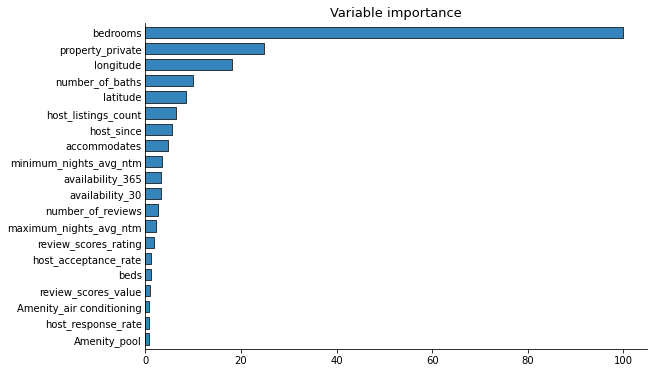

In [145]:
def plot_feature_importance(model, labels, max_features = 20):    
    feature_importance = model.feature_importances_*100    
    feature_importance = 100*(feature_importance/np.max(feature_importance))    
    table = pd.Series(feature_importance, index = labels).sort_values(ascending=True, inplace=False)    
    fig, ax = fig, ax = plt.subplots(figsize=(9,6))    
    if len(table) > max_features:        
        table.iloc[-max_features:].T.plot(kind='barh', edgecolor='black', width=0.7, linewidth=.8, alpha=0.9, ax=ax)    
    else:        
        table.T.plot(kind='barh', edgecolor='black', width=0.7, linewidth=.8, alpha=0.9, ax=ax)    
    ax.tick_params(axis=u'y', length=0)     
    ax.set_title('Variable importance', fontsize=13)    
    sns.despine()    
    return fig, ax

feature_names = predictors.columns.to_list()

plot_feature_importance(RF, feature_names)
plt.show()

## 4.4. Regularised Linear
Considering the huge number of predictors in the training data, there might be severe multicollinearity. Ridge and Lasso can be used to prevent the overfitting problem caused by multicollinearity. 

### Ridge

In [146]:
RDparameters={'alpha':[0.1,0.2,0.5,0.6,0.7,0.8,0.9,1,10]}
RDopt = GridSearchCV(Ridge(),RDparameters,scoring=rmsle_scorer,cv=kfold)
RDopt.fit(predictors,target)
print(RDopt.best_params_)

{'alpha': 0.6}


In [147]:
RD = Ridge(alpha = RDopt.best_params_['alpha'])
RD_CV_results = cross_val_score(RD, X = predictors, y = target, scoring=rmsle_scorer ,cv=kfold)
print('RMSLE of Cross-Validation data with tuned Ridge: {:.6f}'.format(-RD_CV_results.mean()))

RMSLE of Cross-Validation data with tuned Ridge: 0.423853


In [148]:
RD.fit(predictors, target)
submit_tocsv_adjusted(RD, 'Ridge')

        id       price
0        0   88.602006
1        1   84.345225
2        2  181.273252
3        3   97.197556
4        4   73.187975
...    ...         ...
8742  8742   95.563536
8743  8743  109.020154
8744  8744  182.386360
8745  8745  558.462865
8746  8746   76.442563

[8747 rows x 2 columns]


### Lasso

In [149]:
LSparameters={'alpha':[1e-07,1e-06,1e-05,1e-04,1e-03,0.01,0.1,1]}
LSopt = GridSearchCV(Lasso(),LSparameters,scoring=rmsle_scorer,cv=kfold)
LSopt.fit(predictors,target)
print(LSopt.best_params_)

{'alpha': 0.0001}


In [150]:
LS = Lasso(alpha = LSopt.best_params_['alpha'])
LS_CV_results = cross_val_score(LS, X = predictors, y = target, scoring=rmsle_scorer ,cv=kfold)
print('RMSLE of Validation data with tuned Lasso: {:.6f}'.format(-LS_CV_results.mean()))

RMSLE of Validation data with tuned Lasso: 0.423638


In [151]:
LS.fit(predictors, target)
submit_tocsv_adjusted(LS, 'Lasso')

        id       price
0        0   88.525404
1        1   85.320163
2        2  183.512312
3        3   95.787088
4        4   73.694469
...    ...         ...
8742  8742   96.054874
8743  8743  108.556522
8744  8744  182.069088
8745  8745  554.104466
8746  8746   77.387617

[8747 rows x 2 columns]


## 4.5. XGBoost

In [152]:
clf = GridSearchCV(XGBRegressor(),
                   {'n_estimators':[400,500],
                    'max_depth':[2,5,8],
                    'learning_rate':[ 0.1, 0.07, 0.04,]}, 
                   verbose = 0,
                   scoring = rmsle_scorer,
                  )

X_xgb = predictors.values

clf_result = clf.fit(X_xgb, target)

print(clf_result.best_score_)
print(clf_result.best_params_)

-0.3789216834090875
{'learning_rate': 0.04, 'max_depth': 8, 'n_estimators': 500}


In [153]:
XGB = XGBRegressor(learning_rate = clf_result.best_params_['learning_rate'],
                       max_depth = clf_result.best_params_['max_depth'],
                       n_estimators = clf_result.best_params_['n_estimators'],)

In [154]:

XGB_CV_results = cross_val_score(XGB, X = X_xgb, y = target, scoring=rmsle_scorer ,cv=kfold)
print('RMSLE of Cross-Validation data with tuned XGBoost: {:.6f}'.format(-XGB_CV_results.mean()))

RMSLE of Cross-Validation data with tuned XGBoost: 0.378497


In [155]:
XGB.fit(X_xgb, target)

X_test_xgb = X_test.values

y_hat = XGB.predict(X_xgb)
residuals = target - y_hat
adj = np.mean(np.exp(residuals))
final_predict = np.exp(XGB.predict(X_test_xgb)) * adj
submission = pd.DataFrame(np.c_[test.index, final_predict], columns = ['id','price'])
submission['id'] = submission['id'].astype('int')
submission.to_csv('{} model prediction.csv'.format('XGBoost'), index = False)
print(submission)



        id       price
0        0   84.321945
1        1   69.609016
2        2  156.190552
3        3   95.963547
4        4   73.555534
...    ...         ...
8742  8742   78.893822
8743  8743   73.468742
8744  8744  165.935287
8745  8745  699.955750
8746  8746   92.187149

[8747 rows x 2 columns]


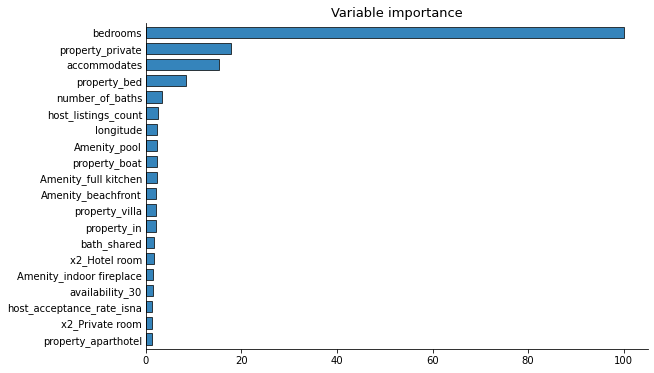

In [156]:
plot_feature_importance(XGB, feature_names)
plt.show()

## 4.6. LightGBM with hyperparameter tuning

In [157]:
train_data = lgb.Dataset(X_train, y_train)
valid_data = lgb.Dataset(X_valid, y_valid, reference = train_data)

def rmsle_lgbm(y_pred, data):
    '''define the metrics used in lightgbm hyper parameter tuning'''
    y_true = np.array(data.get_label())
    score = np.sqrt(mean_squared_log_error( np.exp(y_true), np.exp(y_pred) ))
    return 'rmsle', score, False

def objective(trial):
    
    params = {
    'objective': 'regression',
    'boosting_type': 'gbdt',
    'learning_rate': 0.03, 
    'verbose' : -1,
    'feature_pre_filter': False,
    'num_leaves': trial.suggest_int('num_leaves', 2, 64),
    'max_depth' :trial.suggest_int('max_depth', 1, 8),
    'lambda_l1': trial.suggest_loguniform('lambda_l1',  1e-8, 10), 
    'lambda_l2': trial.suggest_loguniform('lambda_l2',  1e-8, 10), 
    'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.5, 1.0),
    'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
    'feature_fraction':  trial.suggest_uniform('feature_fraction', 0.3, 1.0),
    'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 128), 
    'metric': 'custom'
     }
    
    # Cross-validation 
    history = lgb.cv(params, train_data, num_boost_round = 5000, 
                 nfold = 5, feval  = rmsle_lgbm, stratified = False, early_stopping_rounds = 50)
    
    
    # Save full set of parameters
    trial.set_user_attr('params', params)
    
    # Save the number of boosting iterations selected by early stopping
    trial.set_user_attr('num_boost_round', len(history['rmsle-mean']))
    
    return history['rmsle-mean'][-1] # returns CV error for the best trial

sampler = TPESampler(seed = 42) 
study = optuna.create_study(direction='minimize', sampler=sampler)
study.optimize(objective, n_trials=200, timeout = 1200)  

[I 2021-11-12 18:22:12,163] A new study created in memory with name: no-name-2a6dd2ee-53b7-45ed-8dfc-4af20a016519
[I 2021-11-12 18:22:36,617] Trial 0 finished with value: 0.3817045786826048 and parameters: {'num_leaves': 25, 'max_depth': 8, 'lambda_l1': 0.038720902953704193, 'lambda_l2': 0.0024430162614261413, 'bagging_fraction': 0.5780093202212182, 'bagging_freq': 2, 'feature_fraction': 0.3406585285177396, 'min_data_in_leaf': 111}. Best is trial 0 with value: 0.3817045786826048.
[I 2021-11-12 18:23:04,799] Trial 1 finished with value: 0.37870291701008096 and parameters: {'num_leaves': 39, 'max_depth': 6, 'lambda_l1': 1.5320059381854043e-08, 'lambda_l2': 5.360294728728285, 'bagging_fraction': 0.9162213204002109, 'bagging_freq': 3, 'feature_fraction': 0.42727747704497043, 'min_data_in_leaf': 24}. Best is trial 1 with value: 0.37870291701008096.
[I 2021-11-12 18:23:35,878] Trial 2 finished with value: 0.37935089680494094 and parameters: {'num_leaves': 21, 'max_depth': 5, 'lambda_l1': 7.7

[I 2021-11-12 18:33:48,475] Trial 22 finished with value: 0.37812159320501343 and parameters: {'num_leaves': 48, 'max_depth': 5, 'lambda_l1': 0.0074069554318589555, 'lambda_l2': 7.819651043595972, 'bagging_fraction': 0.9309897048396671, 'bagging_freq': 8, 'feature_fraction': 0.36015108111142036, 'min_data_in_leaf': 9}. Best is trial 21 with value: 0.37753653530000053.
[I 2021-11-12 18:34:10,143] Trial 23 finished with value: 0.3782032737681781 and parameters: {'num_leaves': 58, 'max_depth': 7, 'lambda_l1': 0.00013632287140494554, 'lambda_l2': 1.2346992633883103, 'bagging_fraction': 0.8558596570861845, 'bagging_freq': 5, 'feature_fraction': 0.3652320774751969, 'min_data_in_leaf': 15}. Best is trial 21 with value: 0.37753653530000053.
[I 2021-11-12 18:34:33,412] Trial 24 finished with value: 0.37888565728491697 and parameters: {'num_leaves': 52, 'max_depth': 6, 'lambda_l1': 0.3873695663611079, 'lambda_l2': 2.103128823406421, 'bagging_fraction': 0.9067087287794952, 'bagging_freq': 6, 'fea

In [158]:
params = study.best_trial.user_attrs['params']
num_trees = study.best_trial.user_attrs['num_boost_round']
print(f'Number of boosting iterations: {num_trees} \n')
print('Best parameters:')
params 

Number of boosting iterations: 1161 

Best parameters:


{'objective': 'regression',
 'boosting_type': 'gbdt',
 'learning_rate': 0.03,
 'verbose': -1,
 'feature_pre_filter': False,
 'num_leaves': 57,
 'max_depth': 7,
 'lambda_l1': 5.411628497557572e-05,
 'lambda_l2': 8.521369134520965,
 'bagging_fraction': 0.8835949442193235,
 'bagging_freq': 6,
 'feature_fraction': 0.3567273881450492,
 'min_data_in_leaf': 2,
 'metric': 'custom'}

In [159]:
importance = optuna.importance.get_param_importances(study)
importance

OrderedDict([('max_depth', 0.6726897128651036),
             ('num_leaves', 0.19489818207105358),
             ('bagging_freq', 0.036123145329871265),
             ('min_data_in_leaf', 0.03422839820300973),
             ('lambda_l1', 0.025041074134746554),
             ('feature_fraction', 0.02294429070543366),
             ('bagging_fraction', 0.012861460327722653),
             ('lambda_l2', 0.0012137363630589655)])

In [160]:
lgbm1 = lgb.train(params, train_data, num_boost_round = num_trees)
y_pred = lgbm1.predict(X_valid)

In [161]:
print(rmsle(y_valid, y_pred))

0.3742582937660503


In [162]:
predictors = predictors.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
train_data = lgb.Dataset(predictors, target)
final_lgb = lgb.train(params, train_data, num_boost_round = num_trees)

In [163]:
y_hat = final_lgb.predict(predictors)
residuals = target - y_hat
adj = np.mean(np.exp(residuals))

In [164]:
final_predict = np.exp(final_lgb.predict(X_test)) * adj

In [165]:
submission = pd.DataFrame(np.c_[test.index, final_predict], columns = ['id','price'])
submission['id'] = submission['id'].astype('int')

In [166]:
submission.to_csv('LightGBM model prediction.csv', index = False)
print(submission)

        id       price
0        0   87.864645
1        1   68.604936
2        2  148.739991
3        3   88.994550
4        4   75.219137
...    ...         ...
8742  8742   76.530166
8743  8743   90.145010
8744  8744  186.305227
8745  8745  512.891556
8746  8746   99.518768

[8747 rows x 2 columns]


<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

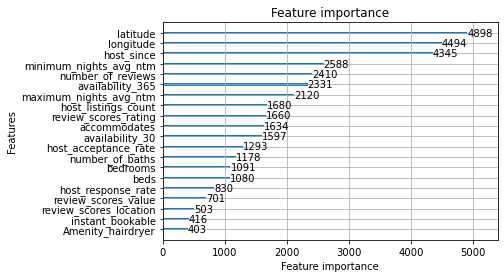

In [167]:
lgb.plot_importance(lgbm1,max_num_features = 20)

In [168]:
# StackingCVRegressor does not support original lgb machine,
# a alternative regressor which compatible with StackingCVRegressor is built
# with all the tuned parameters set.
LGBMSTACKmodel = lgb.LGBMRegressor(
    boosting_type=params['boosting_type'],
    learning_rate=params['learning_rate'],
    num_leaves=params['num_leaves'],
    max_depth= params['max_depth'],
    reg_alpha = params['lambda_l1'],
    reg_lambda = params['lambda_l2'],
    bagging_fraction=params['bagging_fraction'],
    bagging_freq=params['bagging_freq'],
    feature_fraction=params['feature_fraction'],
    min_data_in_leaf=params['min_data_in_leaf'],
    n_estimators = num_trees
)

## 4.7. Model Stacking

In [169]:
stack = StackingCVRegressor(regressors=[LS, RF, XGB, LGBMSTACKmodel],
                            meta_regressor=LGBMSTACKmodel, 
                            cv=5,
                            random_state=42,
                            verbose = 0,
                            use_features_in_secondary = True,
                            store_train_meta_features=True,
                            n_jobs = -1
                           )
predictors_stack = predictors.values
X_test_stack = X_test.values

print('RMSLE of Cross-Validation data with model stack:',
      -cross_val_score(stack,
                       X = predictors_stack,
                       y = target,
                       scoring=rmsle_scorer,
                       cv=kfold,).mean() )

stack.fit(predictors_stack, target)

[LightGBM] [Warning] feature_fraction is set=0.3567273881450492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3567273881450492
[LightGBM] [Warning] min_data_in_leaf is set=2, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2
[LightGBM] [Warning] bagging_fraction is set=0.8835949442193235, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8835949442193235
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.3567273881450492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3567273881450492
[LightGBM] [Warning] min_data_in_leaf is set=2, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2
[LightGBM] [Warning] bagging_fraction is set=0.8835949442193235, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8835949442193235
[LightGBM] [Warning] bagging_freq is set=6, subsam

StackingCVRegressor(meta_regressor=LGBMRegressor(bagging_fraction=0.8835949442193235,
                                                 bagging_freq=6,
                                                 feature_fraction=0.3567273881450492,
                                                 learning_rate=0.03,
                                                 max_depth=7,
                                                 min_data_in_leaf=2,
                                                 n_estimators=1161,
                                                 num_leaves=57,
                                                 reg_alpha=5.411628497557572e-05,
                                                 reg_lambda=8.521369134520965),
                    n_jobs=-1, random_state=42,
                    regressors=[Lasso(alpha=0.0001),
                                RandomForest...
                                             subsample=1, tree_method='exact',
                                         

In [170]:
print(stack.train_meta_features_)

[[4.76970483 4.72658795 4.52419901 4.60465092]
 [5.76398394 5.89829717 5.88332176 5.82862722]
 [4.78986823 4.87022387 4.96949482 4.96218571]
 ...
 [4.55843659 4.5825607  4.61129951 4.61501315]
 [4.75152089 4.81308146 4.80677032 4.70954877]
 [4.68394853 4.59795938 4.59629917 4.64421528]]


In [179]:
stack.get_params(deep=False)

{'cv': 5,
 'meta_regressor': LGBMRegressor(bagging_fraction=0.8835949442193235, bagging_freq=6,
               feature_fraction=0.3567273881450492, learning_rate=0.03,
               max_depth=7, min_data_in_leaf=2, n_estimators=1161, num_leaves=57,
               reg_alpha=5.411628497557572e-05, reg_lambda=8.521369134520965),
 'multi_output': False,
 'n_jobs': -1,
 'pre_dispatch': '2*n_jobs',
 'random_state': 42,
 'refit': True,
 'regressors': [Lasso(alpha=0.0001),
  RandomForestRegressor(max_depth=90, min_samples_leaf=2, n_estimators=150),
  XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
               colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
               importance_type='gain', interaction_constraints='',
               learning_rate=0.04, max_delta_step=0, max_depth=8,
               min_child_weight=1, missing=nan, monotone_constraints='()',
               n_estimators=500, n_jobs=16, num_parallel_tree=1, random_state=0,
               reg

In [171]:
stack.get_params(deep=True)

{'cv': 5,
 'meta_regressor__boosting_type': 'gbdt',
 'meta_regressor__class_weight': None,
 'meta_regressor__colsample_bytree': 1.0,
 'meta_regressor__importance_type': 'split',
 'meta_regressor__learning_rate': 0.03,
 'meta_regressor__max_depth': 7,
 'meta_regressor__min_child_samples': 20,
 'meta_regressor__min_child_weight': 0.001,
 'meta_regressor__min_split_gain': 0.0,
 'meta_regressor__n_estimators': 1161,
 'meta_regressor__n_jobs': -1,
 'meta_regressor__num_leaves': 57,
 'meta_regressor__objective': None,
 'meta_regressor__random_state': None,
 'meta_regressor__reg_alpha': 5.411628497557572e-05,
 'meta_regressor__reg_lambda': 8.521369134520965,
 'meta_regressor__silent': True,
 'meta_regressor__subsample': 1.0,
 'meta_regressor__subsample_for_bin': 200000,
 'meta_regressor__subsample_freq': 0,
 'meta_regressor__bagging_fraction': 0.8835949442193235,
 'meta_regressor__bagging_freq': 6,
 'meta_regressor__feature_fraction': 0.3567273881450492,
 'meta_regressor__min_data_in_leaf': 2

In [172]:
y_hat = stack.predict(predictors_stack)
residuals = target - y_hat
adj = np.mean(np.exp(residuals))
final_predict = np.exp(stack.predict(X_test_stack)) * adj

submission = pd.DataFrame(np.c_[test.index, final_predict], columns = ['id','price'])
submission['id'] = submission['id'].astype('int')
submission.to_csv('{} model prediction.csv'.format('Stacking'), index = False)
print(submission)


        id       price
0        0   81.512909
1        1   68.004432
2        2  153.303179
3        3   83.964141
4        4   73.594064
...    ...         ...
8742  8742   69.253275
8743  8743   84.974242
8744  8744  168.426494
8745  8745  517.360344
8746  8746   87.222718

[8747 rows x 2 columns]


# 5. Data mining

In [173]:
train['DMcriteria'] = train['price'] / train['accommodates']

In [174]:
train['DMclass'] = train['DMcriteria'] > 75

In [175]:
train['DMclass'] = train['DMclass'].apply(int)

0        0
1        0
2        1
3        1
4        0
        ..
20403    0
20404    0
20405    0
20406    0
20407    0
Name: DMclass, Length: 20408, dtype: int64

In [176]:
train_DM = train[SelectedFeature] # use engineered features
train_DM = train_DM.drop(['accommodates'], axis =1)
trainDM_X, validDM_X, trainDM_y, validDM_y = train_test_split(train_DM,
                                                              train['DMclass'],
                                                              test_size = 0.3,
                                                              random_state = 42)

[19:10:25] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


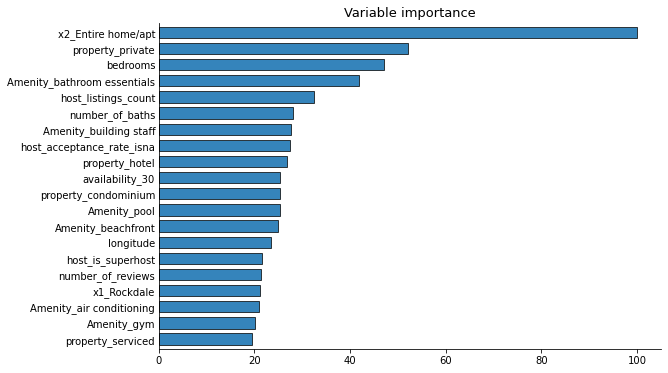

In [177]:
XGBDM = XGBClassifier()
XGBDM.fit(trainDM_X, trainDM_y)
predDM_y = XGBDM.predict(validDM_X)

feature_names = trainDM_X.columns.to_list()

plot_feature_importance(XGBDM, feature_names)
plt.show()

In [178]:
# the roc_auc metrics for the classification
roc_auc_score(validDM_y,predDM_y)

0.6821655583097799